# Data Processing and Wrangling

In [1]:
!pip install matplotlib --upgrade
!pip install statsmodels
!pip install fbprophet
!pip install pystan
!pip install pmdarima
!pip install tensorflow
!pip install keras
!pip install xgboost

## Importing required libraries

In [2]:
from pathlib import Path

from dateutil.parser import parse 

from matplotlib.pyplot import cm

from plotly.subplots import make_subplots

from scipy import signal

from pandas.api.indexers import BaseIndexer
from pandas.plotting import autocorrelation_plot

from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.api import OLS
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.api import Holt
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from math import sqrt 
from pmdarima import auto_arima
from fbprophet import Prophet
from prophet.plot import plot_plotly,plot_components_plotly 
from datetime import datetime
from datetime import timedelta
from tqdm import tqdm_notebook
from itertools import product
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

from xgboost import XGBRegressor
import xgboost as xgb

import plotly.io as pio
import plotly.express as px
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import itertools
import os
import warnings 
import datetime

import tensorflow as tf


import warnings
warnings.filterwarnings('ignore')

2022-10-26 11:04:19.103897: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-26 11:04:19.259623: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-10-26 11:04:19.259646: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-10-26 11:04:19.285609: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-26 11:04:19.915839: W tensorflow/stream_executor/platform/de

In [3]:
csvs = Path("/home/dmacs/Documents/Pranav_Phanindra/Data_Scraping_Final/Data_Part_2/Collated/CSVs")

#Directory containing all the files
DataFiles = os.listdir(csvs)
DataFiles

['13_Soyabean.csv',
 '263_Bengal+Gram+Dal+(Chana+Dal).csv',
 '1_Wheat.csv',
 '4_Maize.csv',
 '29_Barley+(Jau).csv',
 '12_Mustard.csv']

In [4]:
CropData = pd.read_csv(csvs / '13_Soyabean.csv' , parse_dates = ['Price Date'])
CropData = CropData.iloc[:,1:]

In [5]:
CropData['Price Date'] =  pd.to_datetime(CropData['Price Date'])

CropData['Yr-mon'] = CropData['Price Date'].dt.strftime('%Y%m')
CropData['Yr-mon'] = pd.to_datetime(CropData['Yr-mon'], format = '%Y%m')

CropData['Year'] = CropData.set_index('Yr-mon').index.year
CropData['Month'] = CropData.set_index('Yr-mon').index.month

CropData.set_index('Price Date')

,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),State,Yr-mon,Year,Month
Price Date,,,,,,,,,,,,
2015-12-08,Chittor,Madanapalli,Soyabean,Soyabeen,Medium,2600.0,3000.0,2700.0,Andhra Pradesh,2015-12-01,2015,12
2015-12-07,Chittor,Madanapalli,Soyabean,Local,Medium,2600.0,3000.0,2700.0,Andhra Pradesh,2015-12-01,2015,12
2015-11-30,Chittor,Madanapalli,Soyabean,Soyabeen,Medium,2600.0,3000.0,2700.0,Andhra Pradesh,2015-11-01,2015,11
2015-11-29,Chittor,Madanapalli,Soyabean,Soyabeen,Medium,2600.0,3000.0,2700.0,Andhra Pradesh,2015-11-01,2015,11
2015-11-28,Chittor,Madanapalli,Soyabean,Soyabeen,Medium,2600.0,3000.0,2700.0,Andhra Pradesh,2015-11-01,2015,11
...,...,...,...,...,...,...,...,...,...,...,...,...
2009-08-01,Agra,Samsabad,Soyabean,Other,FAQ,2075.0,2154.0,2100.0,Uttar Pradesh,2009-08-01,2009,8
2013-11-02,Bankura,Bishnupur(Bankura),Soyabean,Other,FAQ,0.0,5200.0,5200.0,West Bengal,2013-11-01,2013,11
2013-10-09,Bankura,Bishnupur(Bankura),Soyabean,Other,FAQ,0.0,5300.0,5300.0,West Bengal,2013-10-01,2013,10


In [6]:
CropData_Summarized = CropData.groupby(['Yr-mon'],as_index = False).mean()

CropData_Summarized['Year'] = CropData_Summarized.set_index('Yr-mon').index.year
CropData_Summarized['Month'] = CropData_Summarized.set_index('Yr-mon').index.month

years = CropData_Summarized['Year'].unique()


month = CropData_Summarized['Month'].unique()


In [7]:
CropData_Summarized['SMA(12)'] = CropData_Summarized.rolling(12,center = True).mean()['Modal Price (Rs./Quintal)']
CropData_Summarized['Price-SMA(12)'] = CropData_Summarized['Modal Price (Rs./Quintal)']-CropData_Summarized[CropData_Summarized['SMA(12)'].notnull()]['SMA(12)']


In [8]:
PrSmaMon = pd.DataFrame()
PrSmaMon['Seasonal_Average'] = CropData_Summarized[CropData_Summarized['SMA(12)'].notnull()].groupby('Month').mean()['Price-SMA(12)']
k = PrSmaMon.mean()

PrSmaMon = PrSmaMon.subtract(k) 

del(k)

PrSmaMon

,Seasonal_Average
Month,
1,-59.350212
2,-46.655590
3,-43.911740
4,186.548970
5,241.789579
6,127.302278
7,187.192931
8,196.239485
9,-74.338661


In [9]:
CropData_Summarized=pd.merge(CropData_Summarized, PrSmaMon.reset_index() , on='Month', how='outer')
CropData_Summarized

,Yr-mon,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,SMA(12),Price-SMA(12),Seasonal_Average
0,2008-04-01,1808.696324,2066.126417,2039.881656,2008,4,NaN,NaN,186.54897
1,2009-04-01,2211.961038,2436.446170,2386.916886,2009,4,2068.043667,318.873219,186.54897
2,2010-04-01,1793.620129,1920.323619,1869.649949,2010,4,1978.418236,-108.768287,186.54897
3,2011-04-01,2089.644731,2275.857143,2197.566014,2011,4,2137.131750,60.434264,186.54897
4,2012-04-01,2806.490686,3052.026159,2964.558462,2012,4,2888.510964,76.047498,186.54897
...,...,...,...,...,...,...,...,...,...
163,2018-03-01,3168.483524,3568.179949,3445.578874,2018,3,3114.852001,330.726872,-43.91174
164,2019-03-01,3284.772980,3568.127319,3484.418916,2019,3,3368.630158,115.788758,-43.91174
165,2020-03-01,3072.477461,3562.384421,3422.442842,2020,3,3603.244968,-180.802127,-43.91174
166,2021-03-01,4442.203850,5219.334388,4970.615770,2021,3,5330.807204,-360.191433,-43.91174


In [10]:
#Deseasonalising the Data (Additive Model)
CropData_Summarized['Deseasonlaised_Data'] = CropData_Summarized['Modal Price (Rs./Quintal)'] - CropData_Summarized['Seasonal_Average']

#Detrending inturn Stationarising the Data (Additive Model)
CropData_Summarized['Stationary'] = CropData_Summarized['Deseasonlaised_Data'] - CropData_Summarized['SMA(12)']

CropData_Summarized

,Yr-mon,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,SMA(12),Price-SMA(12),Seasonal_Average,Deseasonlaised_Data,Stationary
0,2008-04-01,1808.696324,2066.126417,2039.881656,2008,4,NaN,NaN,186.54897,1853.332686,NaN
1,2009-04-01,2211.961038,2436.446170,2386.916886,2009,4,2068.043667,318.873219,186.54897,2200.367916,132.324249
2,2010-04-01,1793.620129,1920.323619,1869.649949,2010,4,1978.418236,-108.768287,186.54897,1683.100979,-295.317257
3,2011-04-01,2089.644731,2275.857143,2197.566014,2011,4,2137.131750,60.434264,186.54897,2011.017044,-126.114706
4,2012-04-01,2806.490686,3052.026159,2964.558462,2012,4,2888.510964,76.047498,186.54897,2778.009492,-110.501472
...,...,...,...,...,...,...,...,...,...,...,...
163,2018-03-01,3168.483524,3568.179949,3445.578874,2018,3,3114.852001,330.726872,-43.91174,3489.490614,374.638613
164,2019-03-01,3284.772980,3568.127319,3484.418916,2019,3,3368.630158,115.788758,-43.91174,3528.330657,159.700499
165,2020-03-01,3072.477461,3562.384421,3422.442842,2020,3,3603.244968,-180.802127,-43.91174,3466.354582,-136.890386
166,2021-03-01,4442.203850,5219.334388,4970.615770,2021,3,5330.807204,-360.191433,-43.91174,5014.527510,-316.279693


## Substituting NaN values with monthly averages 

In [11]:
CropData_Summarized.groupby('Month').mean()

,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,SMA(12),Price-SMA(12),Seasonal_Average,Deseasonlaised_Data,Stationary
Month,,,,,,,,,
1,2926.928492,3379.515068,3241.706348,2015.5,3071.173911,-42.947812,-59.350212,3301.056560,16.4024
2,2997.529835,3442.586492,3309.634486,2015.5,3104.560316,-30.253191,-46.655590,3356.290076,16.4024
3,3106.139637,3516.837682,3394.074790,2015.5,3142.603592,-27.509340,-43.911740,3437.986531,16.4024
4,3037.794571,3388.906386,3279.155401,2014.5,3171.532780,202.951370,186.548970,3092.606430,16.4024
5,3106.383693,3472.900629,3359.839357,2014.5,3192.253100,258.191979,241.789579,3118.049778,16.4024
6,2994.879952,3430.445267,3290.613214,2014.5,3217.847452,143.704678,127.302278,3163.310937,16.4024
7,3078.162905,3494.180878,3374.819206,2014.5,3245.444041,203.595331,187.192931,3187.626275,16.4024
8,3128.539965,3517.979767,3407.575421,2014.5,3270.414584,212.641884,196.239485,3211.335936,16.4024
9,2878.263250,3307.256205,3166.554784,2014.5,3297.245965,-57.936261,-74.338661,3240.893445,16.4024


In [12]:
for i in range(CropData_Summarized.shape[0]) :
    if  np.isnan(CropData_Summarized.iloc[i,6]):
        CropData_Summarized.iloc[i,-1]  = CropData_Summarized['Stationary'].mean()

In [13]:
CropData_Summarized.sort_values('Yr-mon',inplace=True)
CropData_Summarized.set_index('Yr-mon',inplace=True)

In [14]:
CropData_Summarized

,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,SMA(12),Price-SMA(12),Seasonal_Average,Deseasonlaised_Data,Stationary
Yr-mon,,,,,,,,,,
2008-04-01,1808.696324,2066.126417,2039.881656,2008,4,NaN,NaN,186.548970,1853.332686,16.4024
2008-05-01,1922.751956,2227.642112,2181.964961,2008,5,NaN,NaN,241.789579,1940.175382,16.4024
2008-06-01,2055.519956,2446.160976,2368.407317,2008,6,NaN,NaN,127.302278,2241.105040,16.4024
2008-07-01,2045.631107,2473.300204,2409.957051,2008,7,NaN,NaN,187.192931,2222.764120,16.4024
2008-08-01,2144.804005,2459.766181,2426.321804,2008,8,NaN,NaN,196.239485,2230.082320,16.4024
...,...,...,...,...,...,...,...,...,...,...
2021-11-01,4709.723052,5956.203131,5551.070236,2021,11,NaN,NaN,-190.454431,5741.524667,16.4024
2021-12-01,5138.265577,6391.457392,6030.475412,2021,12,NaN,NaN,-145.164971,6175.640383,16.4024
2022-01-01,5219.874563,6345.424278,6016.949594,2022,1,NaN,NaN,-59.350212,6076.299806,16.4024


In [15]:
fig = go.Figure()
fig = make_subplots(rows=1, cols=1)
    
fig.add_trace(go.Scatter(x=CropData_Summarized.index,
                         y=CropData_Summarized['Modal Price (Rs./Quintal)'],
                         mode='lines',name = "Modal Price") , row=1, col=1)

fig.add_trace(go.Scatter(x=CropData_Summarized.index
                         ,y=CropData_Summarized['Stationary'],
                         mode='lines' , name = "Stationarised Data"),row=1, col=1)

fig.add_trace(go.Scatter(x=CropData_Summarized.index
                         ,y=CropData_Summarized['SMA(12)'],
                         mode='lines' , name = "SMA(12)"),row=1, col=1)

fig.update_layout(legend_title_text = "Crop Data Summarised")
fig.update_layout(title_text="Modal Price and Stationarised Data",title_y=0.85,title_x=0.5)
fig.update_xaxes(title_text="Price Date")
fig.update_yaxes(title_text="Price")

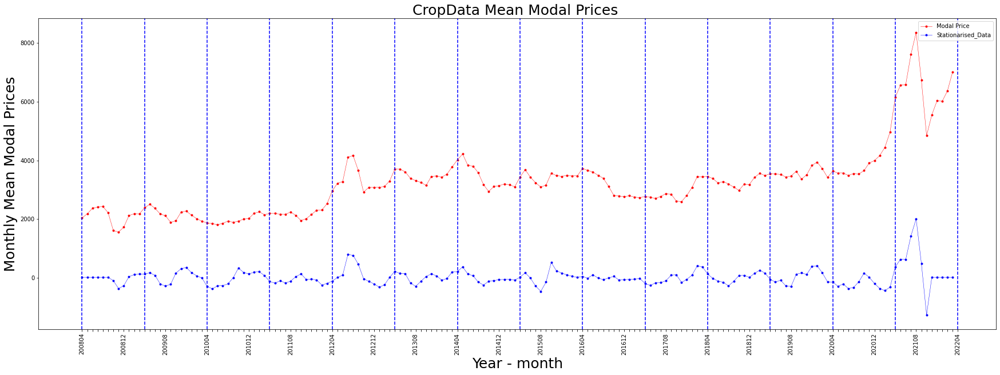

In [16]:
fig , ax = plt.subplots(figsize =  (30 , 10))
ax.plot(
    CropData_Summarized.reset_index()['Yr-mon'].dt.strftime('%Y%m'),
    CropData_Summarized['Modal Price (Rs./Quintal)'] ,
    marker = '.' , 
    linestyle = '-',
    linewidth = '0.5',
    label = 'Modal Price',
    color = 'r'
)
ax.plot(
    CropData_Summarized.reset_index()['Yr-mon'].dt.strftime('%Y%m'),
    CropData_Summarized['Stationary'] ,
    marker = '.' , 
    linestyle = '-',
    linewidth = '0.5',
    label = 'Stationarised_Data',
    color = 'b'
)
plt.xlabel('Year - month', fontsize = 25)
plt.ylabel('Monthly Mean Modal Prices', fontsize = 25)
plt.title("CropData Mean Modal Prices " , fontsize = 25)

plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)
plt.setp(ax.get_xticklabels(), rotation=90)
plt.locator_params(axis='x', nbins=10)
ax.autoscale()

"""
For setting no of labels in xaxis 
ax.xaxis.set_major_locator(plt.MaxNLocator(50))
"""

#Division for each financial year

xcoords = ['{}04'.format(i) for i in range(2008,2023)]
for xc in xcoords:
    plt.axvline(x=xc, color='b', linestyle='--')
    
    
every_nth = 8
for n, label in enumerate(ax.xaxis.get_ticklabels()):
    if n % every_nth != 0:
        label.set_visible(False)


        
ax.legend()

### Analysis 

#### Additive Decomposition

###### Y[t] = T[t] + S[t] + e[t]

     Y[t]: Our time-series function
     T[t]: Trend (general tendency to move up or down)
     S[t]: Seasonality (cyclic pattern occurring at regular intervals)
     e[t]: Residual (random noise in the data that isn’t accounted for in the trend or seasonality

In [17]:
def seasonal_decompose_add(y):
     decomposition = sm.tsa.seasonal_decompose(y, model='additive',extrapolate_trend='freq')
     fig = decomposition.plot()
     fig.set_size_inches(30,10)
     plt.show()



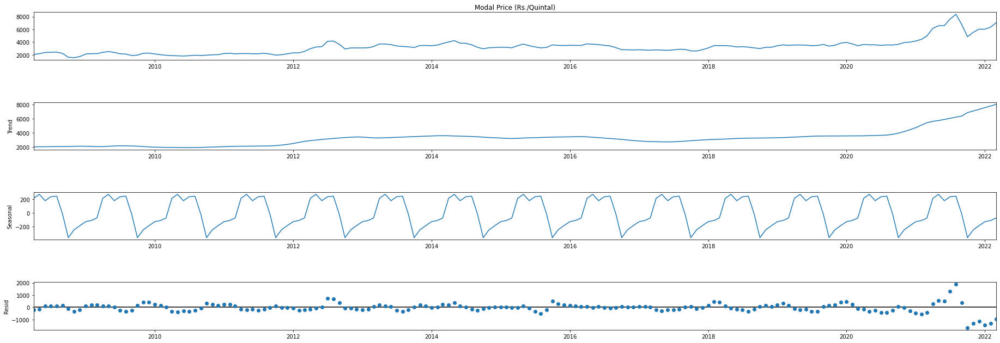

In [18]:
seasonal_decompose_add(CropData_Summarized['Modal Price (Rs./Quintal)'])


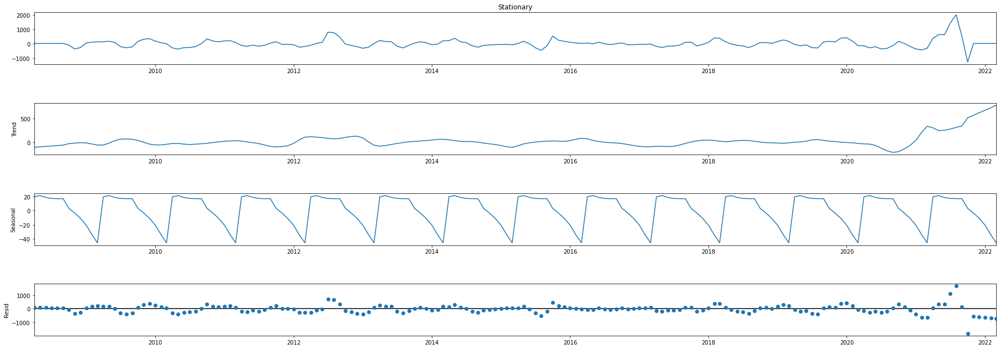

In [19]:
seasonal_decompose_add(CropData_Summarized['Stationary'])

#### Multiplicative

##### Y[t] = T[t] *S[t] *e[t]

##### The amplitude of our seasonality becomes larger or smaller based on the trend. 

        

In [20]:
def seasonal_decompose_mul(y):
     decomposition = sm.tsa.seasonal_decompose(y, model='multiplicative',extrapolate_trend='freq')
     fig = decomposition.plot()
     fig.set_size_inches(30,10)
     plt.show()



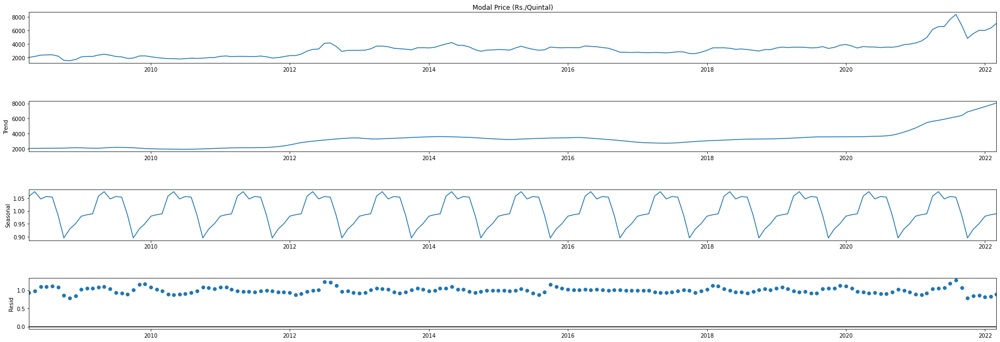

In [21]:
seasonal_decompose_mul(CropData_Summarized['Modal Price (Rs./Quintal)'])

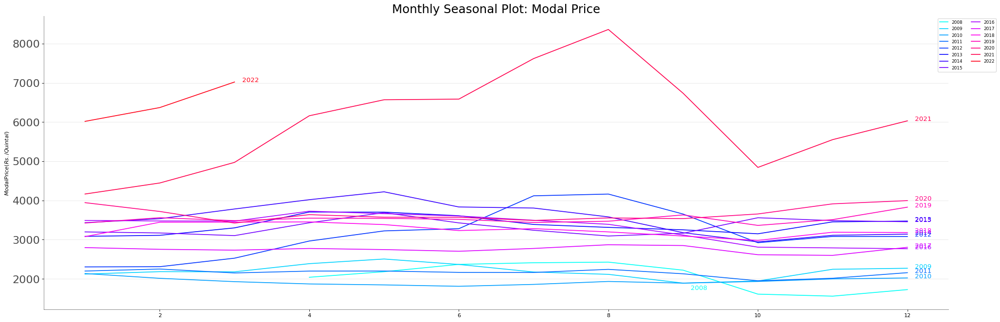

In [22]:

# Draw Plot
#rainbow(np.linspace(0.5, 1, 15))
#hsv(np.linspace(0.5, 1, 15))
mycolors = cm.hsv(np.linspace(0.5, 1, 15))
plt.figure(figsize=(30,10), dpi= 80)

for i, y in enumerate(years):
    plt.plot(
        'Month', 
        'Modal Price (Rs./Quintal)', 
        data = CropData_Summarized.loc[CropData_Summarized.Year == y, :], 
        color=mycolors[i], 
        label=y
    )
    plt.text(
        CropData_Summarized.loc[CropData_Summarized.Year==y, :].shape[0]+0.1, 
        CropData_Summarized.loc[CropData_Summarized.Year==y, 'Modal Price (Rs./Quintal)'][-1:].values[0] + 0.2, 
        y, 
        fontsize=12, 
        color=mycolors[i]
    )

    
# Decoration

plt.ylabel('$Modal Price (Rs./Quintal)$')
plt.yticks(fontsize=20, alpha=.7)
plt.title("Monthly Seasonal Plot: Modal Price", fontsize=22)
plt.grid(axis='y', alpha=.3)

# Remove borders
plt.gca().spines["top"].set_alpha(0.0)    
plt.gca().spines["bottom"].set_alpha(0.5)
plt.gca().spines["right"].set_alpha(0.0)    
plt.gca().spines["left"].set_alpha(0.5)   
plt.legend(loc=0, 
           ncol=2, 
           fontsize=8,
          bbox_to_anchor=(0.555, 0.5, 0.5, 0.5))
plt.show()

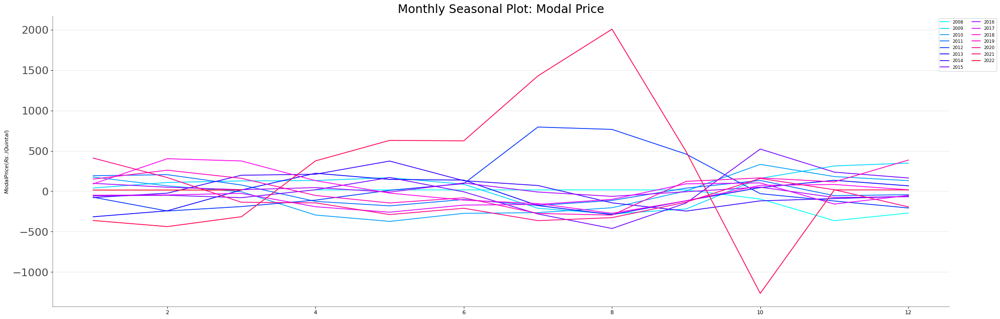

In [23]:

# Draw Plot
#rainbow(np.linspace(0.5, 1, 15))
#hsv(np.linspace(0.5, 1, 15))
mycolors = cm.hsv(np.linspace(0.5, 1, 15))
plt.figure(figsize=(30,10), dpi= 80)

for i, y in enumerate(years):
    plt.plot(
        'Month', 
        'Stationary', 
        data = CropData_Summarized.loc[CropData_Summarized.Year == y, :], 
        color=mycolors[i], 
        label=y
    )
    """plt.text(
        CropData_Summarized.loc[CropData_Summarized.Year==y, :].shape[0]+0.1, 
        CropData_Summarized.loc[CropData_Summarized.Year==y, 'Modal Price (Rs./Quintal)'][-1:].values[0] + 0.2, 
        y, 
        fontsize=12, 
        color=mycolors[i]
    )
"""
    
# Decoration

plt.ylabel('$Modal Price (Rs./Quintal)$')
plt.yticks(fontsize=20, alpha=.7)
plt.title("Monthly Seasonal Plot: Modal Price", fontsize=22)
plt.grid(axis='y', alpha=.3)

# Remove borders
plt.gca().spines["top"].set_alpha(0.0)    
plt.gca().spines["bottom"].set_alpha(0.5)
plt.gca().spines["right"].set_alpha(0.0)    
plt.gca().spines["left"].set_alpha(0.5)   
plt.legend(loc=0, 
           ncol=2, 
           fontsize=8,
          bbox_to_anchor=(0.555, 0.5, 0.5, 0.5))
plt.show()

##### Polar Plots for Ranges

In [24]:
fig = px.line_polar(
    CropData_Summarized, r="Modal Price (Rs./Quintal)",
    color = "Year",
    theta =  CropData_Summarized.index.strftime('%B'),
    line_close=False,
    color_discrete_sequence=px.colors.sequential.Plasma_r,
    template="plotly_dark"
   )
fig.show()

##### Lag Plots

###### Lag plots help us check whether a data set or a time series is random 
###### Random data donot exhibit any identifieable structure 

###### A lag is a fixed time displacement , would whether is  there any correlation in data and would help us find  a suitable model for the data and also helps us to find outliers


In [25]:
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold',
)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

Text(0.5, 1.0, 'Lag Plot of Modal Price (Lag = 12)')

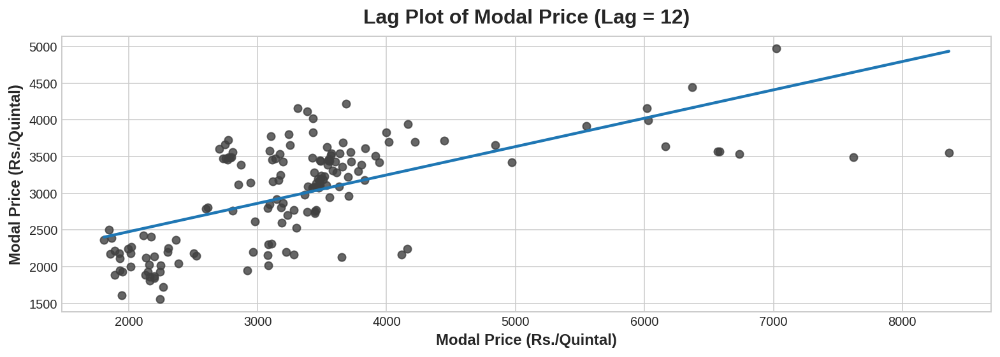

In [26]:
fig, ax = plt.subplots()

ax = sns.regplot(
    x= 'Modal Price (Rs./Quintal)', 
    y=CropData_Summarized['Modal Price (Rs./Quintal)'].shift(12), 
    data = CropData_Summarized, 
    ci=None,
    scatter_kws=dict(color='0.25')
)


#ax.set_aspect('equal')
ax.set_title('Lag Plot of Modal Price (Lag = 12)')

#### Autocorrelation

The ACF plot can provide answers to the following questions:

Is the observed time series white noise / random?



Is an observation related to an adjacent observation, an observation twice-removed, and so on?



Can the observed time series be modeled with an MA model? If yes, what is the order?

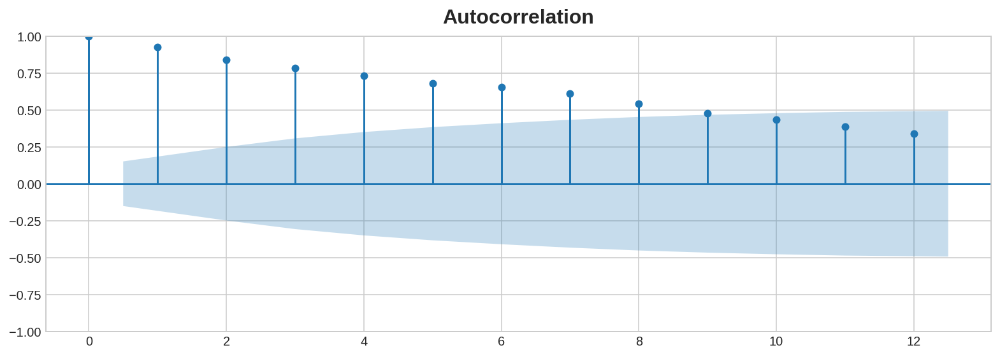

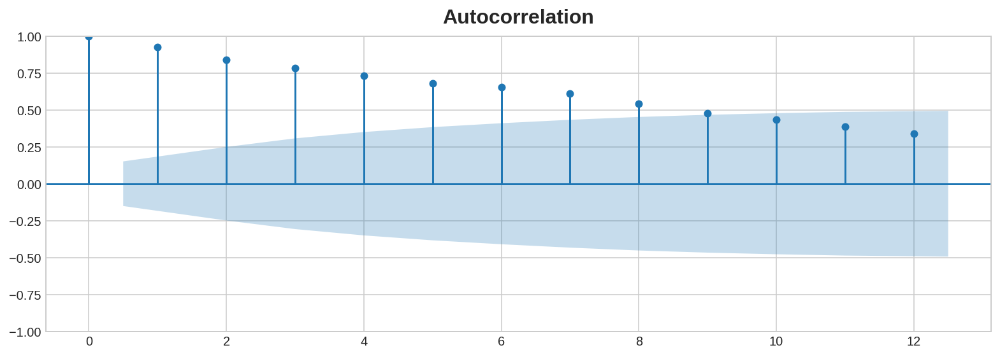

In [27]:
plot_acf(CropData_Summarized['Modal Price (Rs./Quintal)'] ,lags = 12)

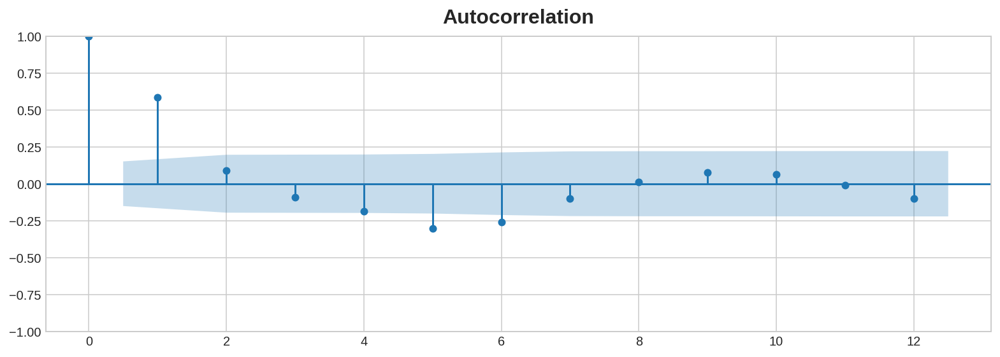

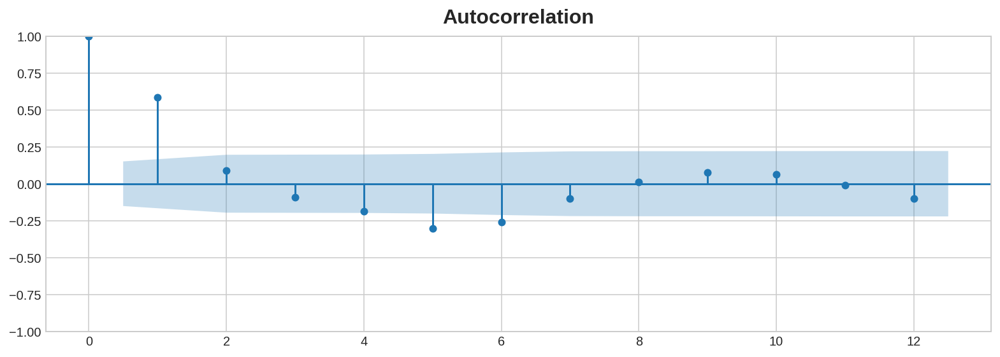

In [28]:
plot_acf(CropData_Summarized['Stationary'] ,lags = 12)

##### So for 95% confidence interval Significant correlation for lag 10 data but not lag 11 or 12 data or only from lag 11 data starts to become stationary

##### Autocorrelation graphs would tell us whether we have trends or any seasonal components in the time series 
##### Here we do have trend component in the time series 
##### But we cannot tell whether what kind of trend it is +VE or -VE trend 

### Partial Autocorrelation

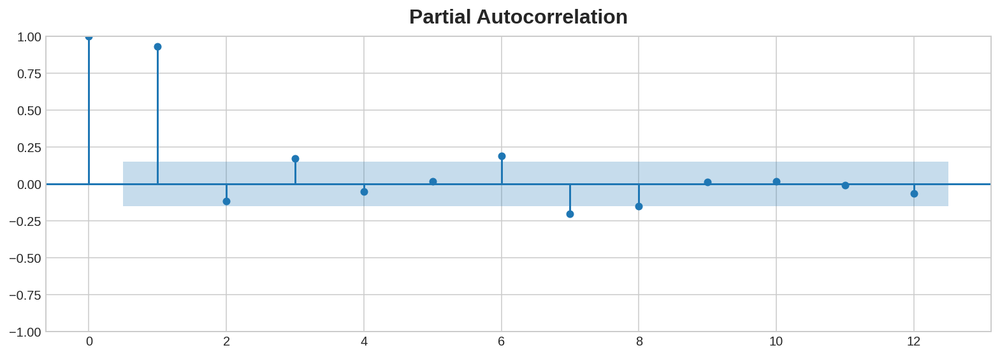

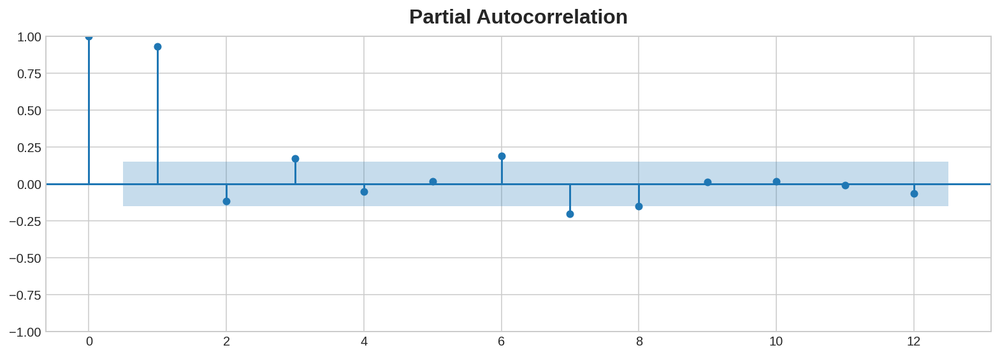

In [29]:
plot_pacf(CropData_Summarized['Modal Price (Rs./Quintal)'],lags = 12)

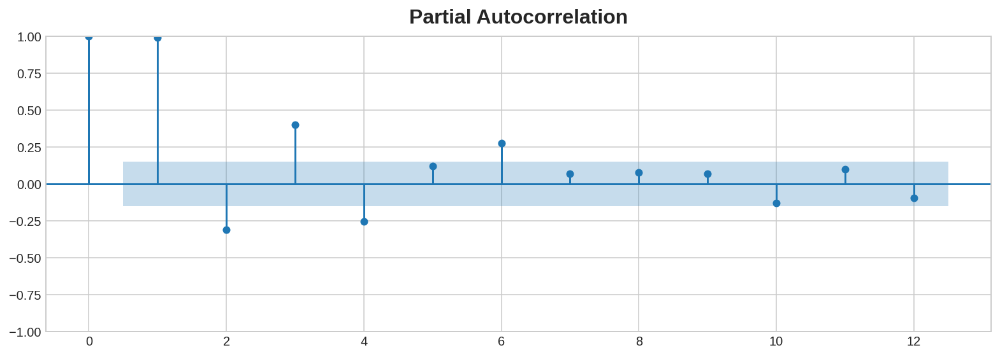

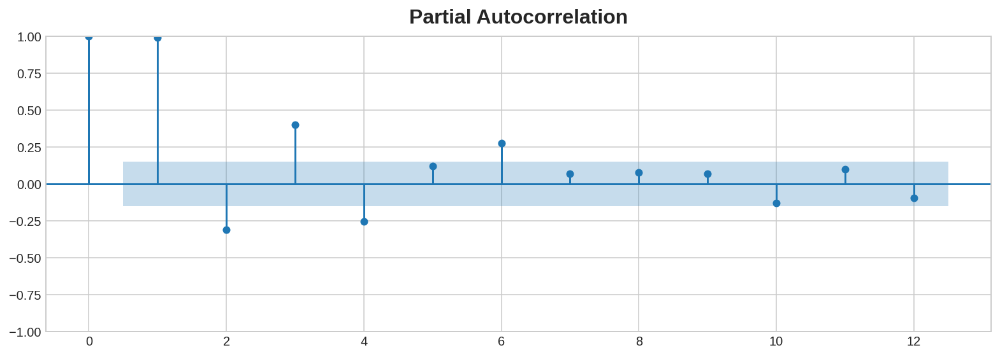

In [30]:
plot_pacf(CropData_Summarized['Modal Price (Rs./Quintal)'],lags = 12,method = "ols")

Hence the order is 1

##### Large spike at lag 1 that decreases after a few lags. ---	A moving average term in the data. Use the autocorrelation function to determine the order of the moving average term.

##### Large spike at lag 1 followed by a damped wave that alternates between positive and negative correlations.	---  A higher order moving average term in the data. Use the autocorrelation function to determine the order of the moving average term.

##### Significant correlations at the first or second lag, followed by correlations that are not significant. ---	An autoregressive term in the data. The number of significant correlations indicate the order of the autoregressive term.

<AxesSubplot: xlabel='Lag', ylabel='Autocorrelation'>

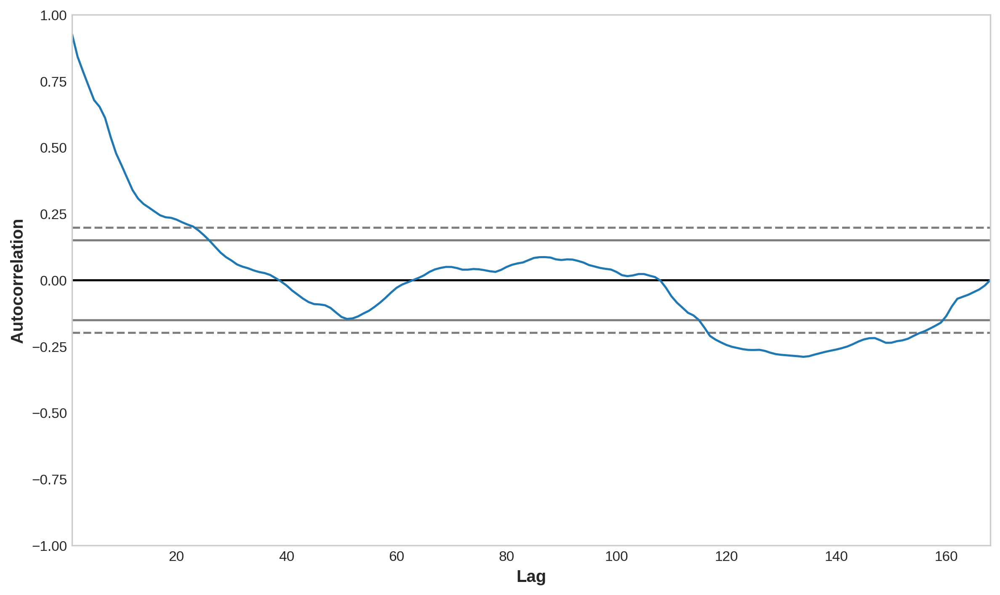

In [31]:
plt.rcParams.update({'figure.figsize':(10,6), 'figure.dpi':120})
autocorrelation_plot(CropData_Summarized['Modal Price (Rs./Quintal)'].tolist())

In [32]:
def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

<AxesSubplot: title={'center': 'Periodogram'}, ylabel='Variance'>

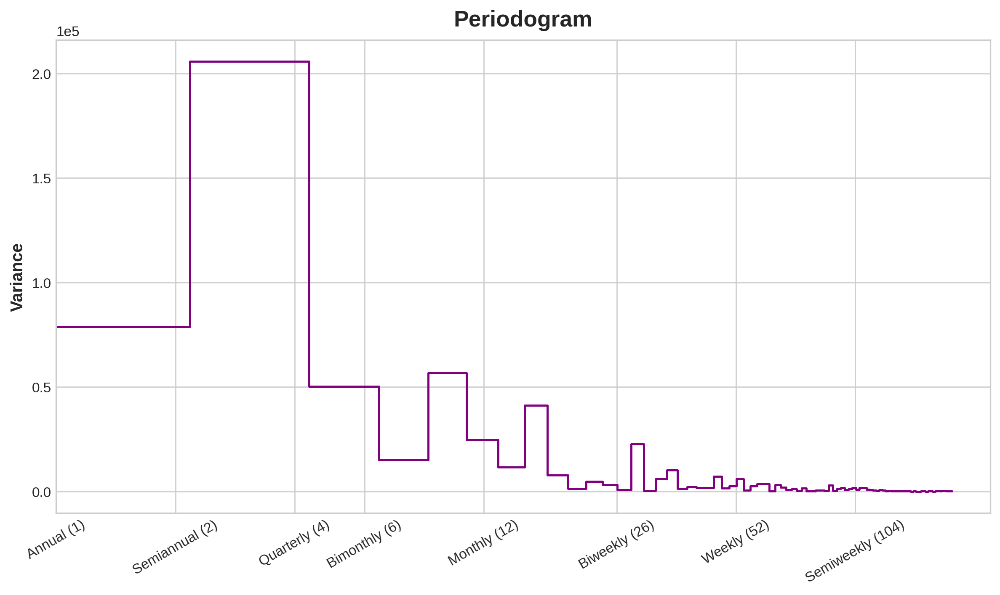

In [33]:
plot_periodogram(CropData_Summarized['Modal Price (Rs./Quintal)'])

In [34]:
fourier = CalendarFourier(freq="A", order=10)  # 10 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=CropData_Summarized.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index

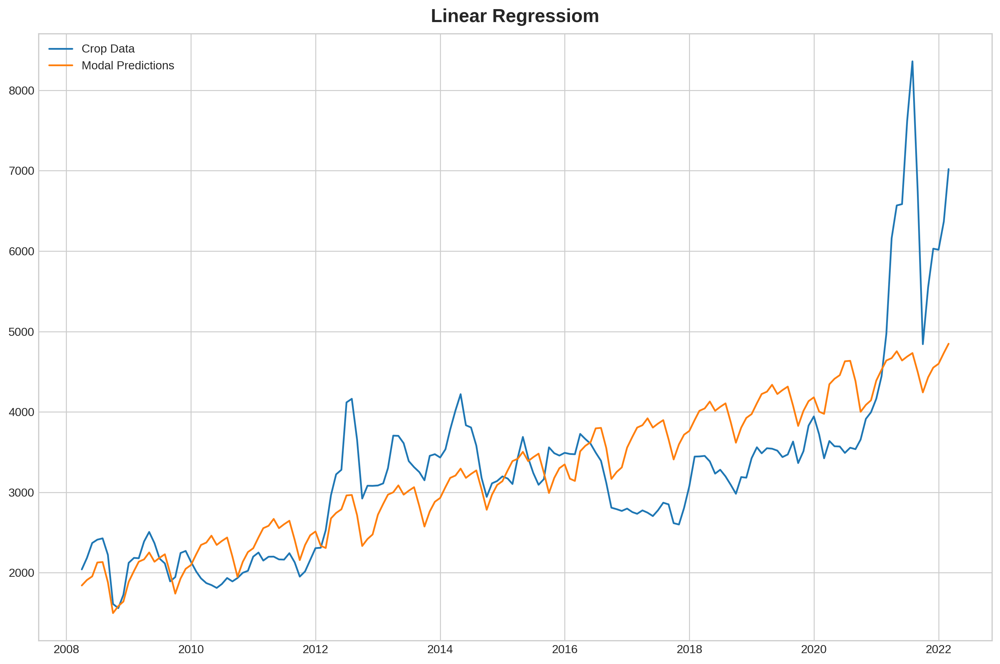

In [35]:
y = CropData_Summarized["Modal Price (Rs./Quintal)"]

model = LinearRegression(fit_intercept=False)
model_fit = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)


plt.figure(figsize=(12,8)) 
plt.plot(CropData_Summarized.index,CropData_Summarized['Modal Price (Rs./Quintal)'], label='Crop Data') 
plt.plot(CropData_Summarized.index,y_pred, label='Modal Predictions') 
plt.legend(loc='best') 
plt.title("Linear Regressiom") 
plt.show()

In [36]:
def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax

def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig




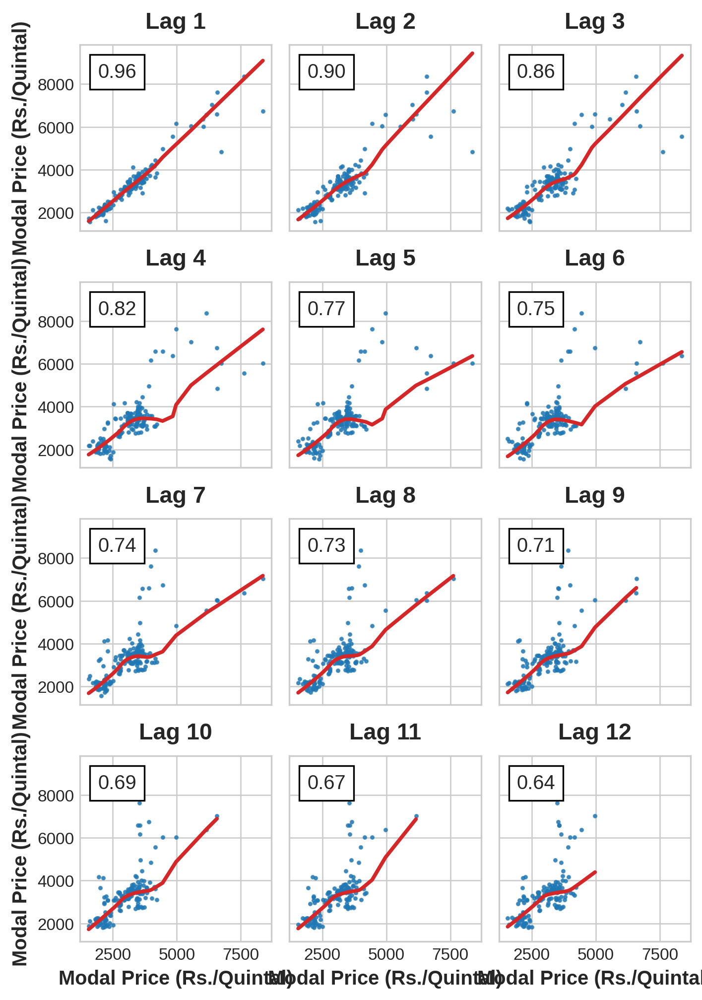

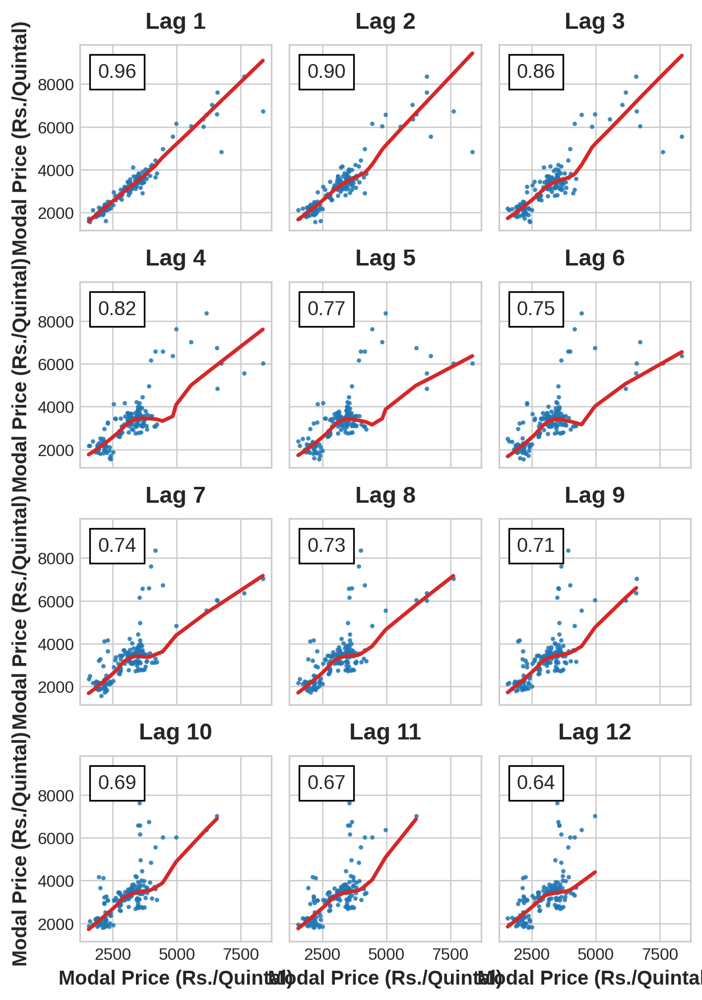

In [37]:
plot_lags(CropData_Summarized['Modal Price (Rs./Quintal)'], lags=12, nrows=4)

### Stationarity 

###### A stationary time series is one whose properties do not depend on the time at which the series is observed.
###### When modeling time series, we often want our sequence of observations to be stationary. This is because it is much easier to forecast a stationary series, as it is more stable than a non-stationary series.
###### Thus, time series with trends, or with seasonality, are not stationary — the trend and seasonality will affect the value of the time series at different times. 


In [38]:
def test_stationarity(timeseries , series_title , legend_title):
    
    """
    Determing rolling statistics
    Rolling mean , window size = 12
    Rolling Std deviation , window size = 12
    """
    
    
    rolmean = pd.Series(timeseries).rolling(window=12,center=True).mean()
    rolmean.index = pd.to_datetime(rolmean.index, format = '%Y-%m-%d')
    
    """
    print(rolmean[rolmean.index.year == 2008])
    print(rolmean.index)
    print(rolmean.index.dtype)
    print(rolmean.dtypes)
    print(rolmean)
    """
    

    rolstd = pd.Series(timeseries).rolling(window=12).std()
    rolstd.index = pd.to_datetime(rolstd.index, format = '%Y-%m-%d')
    
    """
    Printing Data
    print(rolstd.dtypes)
    print(rolstd)
    
    Plotting using matplotlib
    fig, ax = plt.subplots(figsize=(30, 10))
    ax.plot(timeseries, label= title)
    ax.plot(rolmean, label='Rolling mean')
    ax.plot(rolstd, label='Rolling std (x10)')
    ax.legend()
    
    
    Following is interactive plotting using PLotly 
    """
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=timeseries.index,
        y=timeseries,
        mode='lines' ,
        name = series_title
    ))
    
    fig.add_trace(go.Scatter(
        x=timeseries.index,
        y=rolmean,
        mode='lines' , #+markers
        name = "Rolling mean (12)"
    ))

    fig.add_trace(go.Scatter(
        x=timeseries.index,
        y=rolstd,
        mode='lines' , #+markers
        name = "Rolling std (x10) "
    ))
    
    fig.update_layout(legend_title_text = legend_title)
    fig.update_layout(title_text='Stationarity Analysis'+"-"+series_title,title_y=0.85,title_x=0.5)
    fig.update_xaxes(title_text="Price Date")
    fig.update_yaxes(title_text="Price")

    fig.show()    

In [39]:
test_stationarity(CropData_Summarized['Modal Price (Rs./Quintal)'],
                  'Modal Price',
                 'Summarised Crop Data ')

###### White noise series is stationary — it does not matter when you observe it, it should look much the same at any point in time

##### Tests fot stationarity 

 #####   ->  Augmented Dicky Fuller Test (ADF)
    
 #####   ->  Kwiatkowski–Phillips–Schmidt–Shin (KPSS)

In [40]:
def ADF_test(timeseries, dataDesc):
    print(' > Is the {} stationary ?'.format(dataDesc))
    dftest = adfuller(timeseries.dropna(), autolag='AIC')
    print(dftest,'\n')
    print('Lag : {}'.format(dftest[2]))
    print('Test statistic = {:.3f}'.format(dftest[0]))
    print('P-value = {:.3f}'.format(dftest[1]))
    print('Critical values :')
    
    for k, v in dftest[4].items():
        print('\t{}: {} - The data is {} stationary with {}% confidence'.format(k, v, 'not' if v<dftest[0] else '', 100-int(k[:-1])))
    
    
    dftest = adfuller(timeseries.dropna(), maxlag =12 )
    print('\n' , dftest , '\n')
    print('Lag : {}'.format(dftest[2]))
    print('Test statistic = {:.3f}'.format(dftest[0]))
    print('P-value = {:.3f}'.format(dftest[1]))
    print('Critical values :')
    
    for k, v in dftest[4].items():
        print('\t{}: {} - The data is {} stationary with {}% confidence'.format(k, v, 'not' if v<dftest[0] else '', 100-int(k[:-1])))

In [1]:
def kpss_test(series, **kw):    
    statistic, p_value, n_lags, critical_values = kpss(series, nlags = 12 ,**kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')


In [42]:
ADF_test(
    CropData_Summarized['Modal Price (Rs./Quintal)'] ,
    'CropData_Summarised'
)

 > Is the CropData_Summarised stationary ?
(0.051581167695243464, 0.96259554509223, 5, 162, {'1%': -3.471374345647024, '5%': -2.8795521079291966, '10%': -2.5763733302850174}, 2153.758190518137) 

Lag : 5
Test statistic = 0.052
P-value = 0.963
Critical values :
	1%: -3.471374345647024 - The data is not stationary with 99% confidence
	5%: -2.8795521079291966 - The data is not stationary with 95% confidence
	10%: -2.5763733302850174 - The data is not stationary with 90% confidence

 (0.051581167695243464, 0.96259554509223, 5, 162, {'1%': -3.471374345647024, '5%': -2.8795521079291966, '10%': -2.5763733302850174}, 2179.7252797953024) 

Lag : 5
Test statistic = 0.052
P-value = 0.963
Critical values :
	1%: -3.471374345647024 - The data is not stationary with 99% confidence
	5%: -2.8795521079291966 - The data is not stationary with 95% confidence
	10%: -2.5763733302850174 - The data is not stationary with 90% confidence


In [43]:
ADF_test(
    CropData_Summarized['Stationary'] ,
    'Stationarised Data'
)

 > Is the Stationarised Data stationary ?
(-7.29989435243681, 1.3472154795010236e-10, 4, 163, {'1%': -3.471118535474365, '5%': -2.8794405060097024, '10%': -2.576313761526591}, 2106.8724554064306) 

Lag : 4
Test statistic = -7.300
P-value = 0.000
Critical values :
	1%: -3.471118535474365 - The data is  stationary with 99% confidence
	5%: -2.8794405060097024 - The data is  stationary with 95% confidence
	10%: -2.576313761526591 - The data is  stationary with 90% confidence

 (-7.29989435243681, 1.3472154795010236e-10, 4, 163, {'1%': -3.471118535474365, '5%': -2.8794405060097024, '10%': -2.576313761526591}, 2132.2924957675023) 

Lag : 4
Test statistic = -7.300
P-value = 0.000
Critical values :
	1%: -3.471118535474365 - The data is  stationary with 99% confidence
	5%: -2.8794405060097024 - The data is  stationary with 95% confidence
	10%: -2.576313761526591 - The data is  stationary with 90% confidence


In [44]:
kpss_test(CropData_Summarized['Modal Price (Rs./Quintal)'])

KPSS Statistic: 0.8883759627908109
p-value: 0.01
num lags: 12
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary


In [45]:
kpss_test(
    CropData_Summarized['Modal Price (Rs./Quintal)'],
    regression='ct')

KPSS Statistic: 0.1254718893739036
p-value: 0.08801501967795627
num lags: 12
Critial Values:
   10% : 0.119
   5% : 0.146
   2.5% : 0.176
   1% : 0.216
Result: The series is stationary


In [46]:
kpss_test(CropData_Summarized['Stationary'])

KPSS Statistic: 0.12221578737375349
p-value: 0.1
num lags: 12
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is stationary


In [47]:
kpss_test(
    CropData_Summarized['Stationary'],
    regression='ct')

KPSS Statistic: 0.05803959981255083
p-value: 0.1
num lags: 12
Critial Values:
   10% : 0.119
   5% : 0.146
   2.5% : 0.176
   1% : 0.216
Result: The series is stationary


###### So overall what this means to us is, if a series is stationary according to the KPSS test by setting regression='ct' and is not stationary according to the ADF test, it means the series is stationary around a DETERMINISTIC TREND and so is fairly easy to model this series and produce fairly accurate forecasts.

#### Detrending 

###### 1 . Simple Moving Average
######       Period = 12

In [48]:
def SMA(timeseries , title , x_title , y_title ) :
    rolmean = timeseries.rolling(
        window=12,
        center=True
    ).mean()
    
    
    rolmean.index = pd.to_datetime(rolmean.index, 
                                   format = '%Y-%m-%d'
                                  )
    
    fig = go.Figure()
    fig = make_subplots(rows=2, cols=1)
    
    fig.add_trace(go.Scatter(x=timeseries.index,y=timeseries,mode='lines',name = "Modal Price") , row=1, col=1)
    fig.add_trace(go.Scatter(x=timeseries.index,y=rolmean,mode='lines' , name = "Simple moving Average"),row=1, col=1)
    
    fig.update_layout(legend_title_text = "Modal VS Moving Avg ")
    fig.update_layout(title_text=title,title_y=0.85,title_x=0.5)
    fig.update_xaxes(title_text=x_title)
    fig.update_yaxes(title_text=y_title)
    
        
    fig.add_trace(go.Scatter(x=timeseries.index,y=timeseries,
                             mode='lines',
                             name = "Modal Price") , row=2, col=1)
    
    fig.add_trace(go.Scatter(x=timeseries.index,y=timeseries - rolmean,
                             mode='lines' , 
                             name = "Price - SMA"),row=2, col=1)

    fig.update_layout(legend_title_text = "Modal VS Modal - Moving Avg ")
    fig.update_layout(title_text=title,title_y=0.85,title_x=0.5)
    fig.update_xaxes(title_text=x_title)
    fig.update_yaxes(title_text=y_title)
    
    fig.show() 
    
    print(type(rolmean))

In [49]:
SMA(CropData_Summarized['Modal Price (Rs./Quintal)'],
    'Modal Price for Financial Year data of years 2008-2022',
    'Years 2008-2022',
    'Modal Prices')

<class 'pandas.core.series.Series'>




## Making non-stationary data to stationary data - other techniques

### Detrending the data by removing the line of best fit or Regression line

In [50]:
CropData_Summarized['Detrended_Modal_Price'] = signal.detrend(CropData_Summarized['Modal Price (Rs./Quintal)'])
CropData_Summarized

,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,SMA(12),Price-SMA(12),Seasonal_Average,Deseasonlaised_Data,Stationary,Detrended_Modal_Price
Yr-mon,,,,,,,,,,,
2008-04-01,1808.696324,2066.126417,2039.881656,2008,4,NaN,NaN,186.548970,1853.332686,16.4024,239.789745
2008-05-01,1922.751956,2227.642112,2181.964961,2008,5,NaN,NaN,241.789579,1940.175382,16.4024,364.634568
2008-06-01,2055.519956,2446.160976,2368.407317,2008,6,NaN,NaN,127.302278,2241.105040,16.4024,533.838442
2008-07-01,2045.631107,2473.300204,2409.957051,2008,7,NaN,NaN,187.192931,2222.764120,16.4024,558.149694
2008-08-01,2144.804005,2459.766181,2426.321804,2008,8,NaN,NaN,196.239485,2230.082320,16.4024,557.275965
...,...,...,...,...,...,...,...,...,...,...,...
2021-11-01,4709.723052,5956.203131,5551.070236,2021,11,NaN,NaN,-190.454431,5741.524667,16.4024,941.105758
2021-12-01,5138.265577,6391.457392,6030.475412,2021,12,NaN,NaN,-145.164971,6175.640383,16.4024,1403.272453
2022-01-01,5219.874563,6345.424278,6016.949594,2022,1,NaN,NaN,-59.350212,6076.299806,16.4024,1372.508152


In [51]:
test_stationarity(CropData_Summarized['Detrended_Modal_Price'],
                  'Detrended_Modal_Prices',
                  'Detrended Data')

In [52]:
ADF_test(
    CropData_Summarized['Detrended_Modal_Price'] ,
    'Detrended_Modal_Price'
)

 > Is the Detrended_Modal_Price stationary ?
(-1.427464903083812, 0.5690405944449672, 5, 162, {'1%': -3.471374345647024, '5%': -2.8795521079291966, '10%': -2.5763733302850174}, 2151.850796615067) 

Lag : 5
Test statistic = -1.427
P-value = 0.569
Critical values :
	1%: -3.471374345647024 - The data is not stationary with 99% confidence
	5%: -2.8795521079291966 - The data is not stationary with 95% confidence
	10%: -2.5763733302850174 - The data is not stationary with 90% confidence

 (-1.427464903083812, 0.5690405944449672, 5, 162, {'1%': -3.471374345647024, '5%': -2.8795521079291966, '10%': -2.5763733302850174}, 2177.7923247019075) 

Lag : 5
Test statistic = -1.427
P-value = 0.569
Critical values :
	1%: -3.471374345647024 - The data is not stationary with 99% confidence
	5%: -2.8795521079291966 - The data is not stationary with 95% confidence
	10%: -2.5763733302850174 - The data is not stationary with 90% confidence


In [53]:
kpss_test(CropData_Summarized['Detrended_Modal_Price'])

KPSS Statistic: 0.12547188937390324
p-value: 0.1
num lags: 12
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is stationary


In [54]:
kpss_test(
    CropData_Summarized['Detrended_Modal_Price'],
    regression='ct')

KPSS Statistic: 0.12547188937390324
p-value: 0.08801501967795694
num lags: 12
Critial Values:
   10% : 0.119
   5% : 0.146
   2.5% : 0.176
   1% : 0.216
Result: The series is stationary


So overall what this means to us is, if a series is stationary according to the KPSS test by setting regression='ct' and is not stationary according to the ADF test, it means the series is stationary around a deterministic trend and so is fairly easy to model this series and produce fairly accurate forecasts.

## Detrending by removing the trend and seasonal components in Seasonal decomposition

###### plt.plot(
######    CropData_Summarized.set_index('Yr-mon')['Modal Price (Rs./Quintal)'] - 
######    sm.tsa.seasonal_decompose(CropData_Summarized.set_index('Yr-mon')['Modal Price (Rs./Quintal)']  , 
######    model = 'additive').trend,
######        )


###### plt.title('Detrended Modal Price (Add)', fontsize=20)

In [55]:
decomposition = sm.tsa.seasonal_decompose(CropData_Summarized['Modal Price (Rs./Quintal)'],model = 'additive')


fig = go.Figure()
fig.add_trace(go.Scatter(
    x=CropData_Summarized.index, 
    y=CropData_Summarized['Modal Price (Rs./Quintal)'] - decomposition.trend.dropna() - decomposition.seasonal.dropna(),
    mode='lines' ,
))

fig.update_layout(title_text="Modal Prices Stationarised",title_y=0.85,title_x=0.5)
fig.update_xaxes(title_text="Price Date")
fig.update_yaxes(title_text="Price")

fig.show()

In [56]:
ADF_test(
    CropData_Summarized['Modal Price (Rs./Quintal)'] - 
    decomposition.trend.dropna()-decomposition.seasonal.dropna(),
    'CropData_Summarised_Detrended(Add)_Seasonal Decomposition'
)

 > Is the CropData_Summarised_Detrended(Add)_Seasonal Decomposition stationary ?
(-5.893593111906551, 2.885994046975748e-07, 14, 141, {'1%': -3.4776006742422374, '5%': -2.882265832283648, '10%': -2.5778219289774156}, 1876.0765312482054) 

Lag : 14
Test statistic = -5.894
P-value = 0.000
Critical values :
	1%: -3.4776006742422374 - The data is  stationary with 99% confidence
	5%: -2.882265832283648 - The data is  stationary with 95% confidence
	10%: -2.5778219289774156 - The data is  stationary with 90% confidence

 (-5.794299450301621, 4.791721685227109e-07, 11, 144, {'1%': -3.476597917537401, '5%': -2.8818291230495543, '10%': -2.5775887982253085}, 1902.2061348611471) 

Lag : 11
Test statistic = -5.794
P-value = 0.000
Critical values :
	1%: -3.476597917537401 - The data is  stationary with 99% confidence
	5%: -2.8818291230495543 - The data is  stationary with 95% confidence
	10%: -2.5775887982253085 - The data is  stationary with 90% confidence


In [57]:
kpss_test(
    CropData_Summarized['Modal Price (Rs./Quintal)'] - 
    decomposition.trend.dropna()-decomposition.seasonal.dropna(),
)

KPSS Statistic: nan
p-value: nan
num lags: 12
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is stationary


In [58]:
kpss_test(
    CropData_Summarized['Modal Price (Rs./Quintal)'] - 
    decomposition.trend.dropna()-decomposition.seasonal.dropna(),
    regression='ct'
)

KPSS Statistic: nan
p-value: nan
num lags: 12
Critial Values:
   10% : 0.119
   5% : 0.146
   2.5% : 0.176
   1% : 0.216
Result: The series is stationary


### Detrending by following method

######  ( price - (moving avg(window = 12)).mean()  ) /  (moving avg(window = 12)).std()  )

In [59]:
Modal = CropData_Summarized['Modal Price (Rs./Quintal)']


In [60]:
Modal_Detrended =  (Modal - Modal.rolling(window=12).mean())/Modal.rolling(window=12).std()

test_stationarity(Modal_Detrended,'Detrended Modal Price','Detrended Price')


ADF_test(Modal_Detrended,'Detrended Modal Price')

 > Is the Detrended Modal Price stationary ?
(-4.779565930575128, 5.949838159003359e-05, 4, 152, {'1%': -3.474120870218417, '5%': -2.880749791423677, '10%': -2.5770126333102494}, 312.3481063100299) 

Lag : 4
Test statistic = -4.780
P-value = 0.000
Critical values :
	1%: -3.474120870218417 - The data is  stationary with 99% confidence
	5%: -2.880749791423677 - The data is  stationary with 95% confidence
	10%: -2.5770126333102494 - The data is  stationary with 90% confidence

 (-4.779565930575128, 5.949838159003359e-05, 4, 152, {'1%': -3.474120870218417, '5%': -2.880749791423677, '10%': -2.5770126333102494}, 315.33710454292356) 

Lag : 4
Test statistic = -4.780
P-value = 0.000
Critical values :
	1%: -3.474120870218417 - The data is  stationary with 99% confidence
	5%: -2.880749791423677 - The data is  stationary with 95% confidence
	10%: -2.5770126333102494 - The data is  stationary with 90% confidence


In [61]:
kpss_test(Modal_Detrended.dropna())

KPSS Statistic: 0.15345552074136518
p-value: 0.1
num lags: 12
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is stationary


In [62]:
kpss_test(Modal_Detrended.dropna() , regression = 'ct' )

KPSS Statistic: 0.09692181517983388
p-value: 0.1
num lags: 12
Critial Values:
   10% : 0.119
   5% : 0.146
   2.5% : 0.176
   1% : 0.216
Result: The series is stationary


## Forecasting

Exponential smoothings methods are appropriate for non-stationary data 



###  Exponential Smoothening

In [63]:
CropData_Summarized

,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Year,Month,SMA(12),Price-SMA(12),Seasonal_Average,Deseasonlaised_Data,Stationary,Detrended_Modal_Price
Yr-mon,,,,,,,,,,,
2008-04-01,1808.696324,2066.126417,2039.881656,2008,4,NaN,NaN,186.548970,1853.332686,16.4024,239.789745
2008-05-01,1922.751956,2227.642112,2181.964961,2008,5,NaN,NaN,241.789579,1940.175382,16.4024,364.634568
2008-06-01,2055.519956,2446.160976,2368.407317,2008,6,NaN,NaN,127.302278,2241.105040,16.4024,533.838442
2008-07-01,2045.631107,2473.300204,2409.957051,2008,7,NaN,NaN,187.192931,2222.764120,16.4024,558.149694
2008-08-01,2144.804005,2459.766181,2426.321804,2008,8,NaN,NaN,196.239485,2230.082320,16.4024,557.275965
...,...,...,...,...,...,...,...,...,...,...,...
2021-11-01,4709.723052,5956.203131,5551.070236,2021,11,NaN,NaN,-190.454431,5741.524667,16.4024,941.105758
2021-12-01,5138.265577,6391.457392,6030.475412,2021,12,NaN,NaN,-145.164971,6175.640383,16.4024,1403.272453
2022-01-01,5219.874563,6345.424278,6016.949594,2022,1,NaN,NaN,-59.350212,6076.299806,16.4024,1372.508152


In [64]:
shuffle_df = pd.DataFrame(CropData_Summarized['Modal Price (Rs./Quintal)'])
#.sample(frac=1)
type(shuffle_df)

train_size = int(0.7 * len(shuffle_df))

# Split your dataset 
train_set = shuffle_df[:train_size]
test_set = shuffle_df[train_size:]


train_set.index = pd.to_datetime(train_set.index)
test_set.index = pd.to_datetime(test_set.index)

train_set.asfreq('M')
test_set.asfreq('M')

train_set.sort_index(inplace=True)
test_set.sort_index(inplace=True)

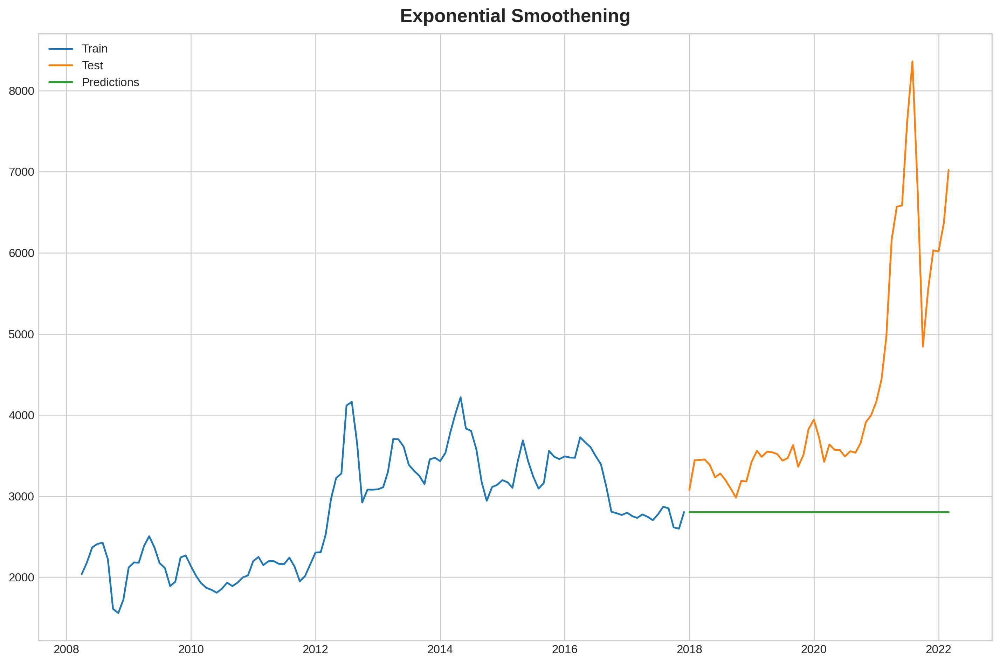

In [65]:
model = ExponentialSmoothing(train_set).fit()
pred = model.forecast(steps = 51)


plt.figure(figsize=(12,8)) 
plt.plot(train_set.index, train_set['Modal Price (Rs./Quintal)'], label='Train') 
plt.plot(test_set.index,test_set['Modal Price (Rs./Quintal)'], label='Test') 
plt.plot(test_set.index,pred, label='Predictions') 
plt.legend(loc='best') 
plt.title("Exponential Smoothening") 
plt.show()

### Simple Exponential Smoothening

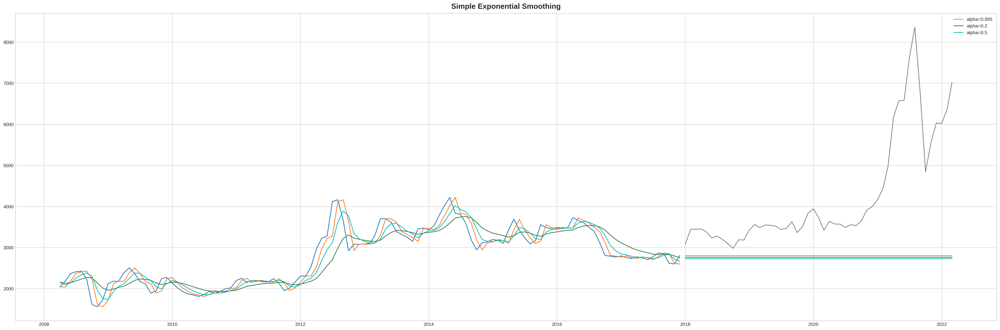

In [66]:
model = SimpleExpSmoothing(np.asarray(train_set['Modal Price (Rs./Quintal)']))
model.index = pd.to_datetime(train_set.index)

fit1 = model.fit()
pred1 = fit1.forecast(51)
fit2 = model.fit(smoothing_level=.2)
pred2 = fit2.forecast(51)
fit3 = model.fit(smoothing_level=.5)
pred3 = fit3.forecast(51)

fig, ax = plt.subplots(figsize=(30, 10))
ax.plot(train_set.index, train_set.values)
ax.plot(test_set.index, test_set.values, color="gray")
for p, f, c in zip((pred1, pred2, pred3),(fit1, fit2, fit3),('#ff7823','#3c763d','c')):
    ax.plot(train_set.index, f.fittedvalues, color=c)
    ax.plot(test_set.index, p, label="alpha="+str(f.params['smoothing_level']), color=c)
plt.title("Simple Exponential Smoothing")    
plt.legend()

In [67]:
def ses(y, y_to_train,y_to_test,smoothing_level,predict_date):
    y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    fit1 = SimpleExpSmoothing(y_to_train).fit(smoothing_level=smoothing_level,optimized=False)
    fcast1 = fit1.forecast(predict_date).rename(r'$\alpha={}$'.format(smoothing_level))
    # specific smoothing level
    fcast1.plot(marker='o', color='blue', legend=True)
    fit1.fittedvalues.plot(marker='o',  color='blue')
    mse1 = ((fcast1 - y_to_test) ** 2).mean()
    #print('The Root Mean Squared Error of our forecasts with smoothing level of {} is {}'.format(smoothing_level,round(np.sqrt(mse1), 2)))
    
    ## auto optimization
    fit2 = SimpleExpSmoothing(y_to_train).fit()
    fcast2 = fit2.forecast(predict_date).rename(r'$\alpha=%s$'%fit2.model.params['smoothing_level'])
    # plot
    fcast2.plot(marker='o', color='green', legend=True)
    fit2.fittedvalues.plot(marker='o', color='green')
    
    mse2 = ((fcast2 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of our forecasts with auto optimization is {}'.format(round(np.sqrt(mse2), 2)))
    
    plt.show()

The Root Mean Squared Error of our forecasts with auto optimization is 2018-01-01 00:00:00         NaN
2018-02-01 00:00:00         NaN
2018-03-01 00:00:00         NaN
2018-04-01 00:00:00         NaN
2018-05-01 00:00:00         NaN
2018-06-01 00:00:00         NaN
2018-07-01 00:00:00         NaN
2018-08-01 00:00:00         NaN
2018-09-01 00:00:00         NaN
2018-10-01 00:00:00         NaN
2018-11-01 00:00:00         NaN
2018-12-01 00:00:00         NaN
2019-01-01 00:00:00         NaN
2019-02-01 00:00:00         NaN
2019-03-01 00:00:00         NaN
2019-04-01 00:00:00         NaN
2019-05-01 00:00:00         NaN
2019-06-01 00:00:00         NaN
2019-07-01 00:00:00         NaN
2019-08-01 00:00:00         NaN
2019-09-01 00:00:00         NaN
2019-10-01 00:00:00         NaN
2019-11-01 00:00:00         NaN
2019-12-01 00:00:00         NaN
2020-01-01 00:00:00         NaN
2020-02-01 00:00:00         NaN
2020-03-01 00:00:00         NaN
2020-04-01 00:00:00         NaN
2020-05-01 00:00:00         NaN
2

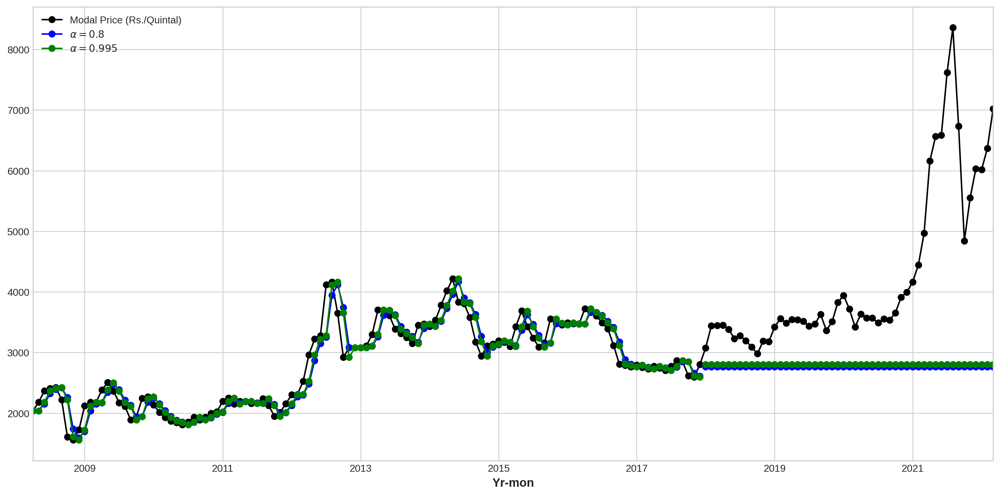

In [68]:
ses(shuffle_df, train_set,test_set,0.8,51)

## Moving Average


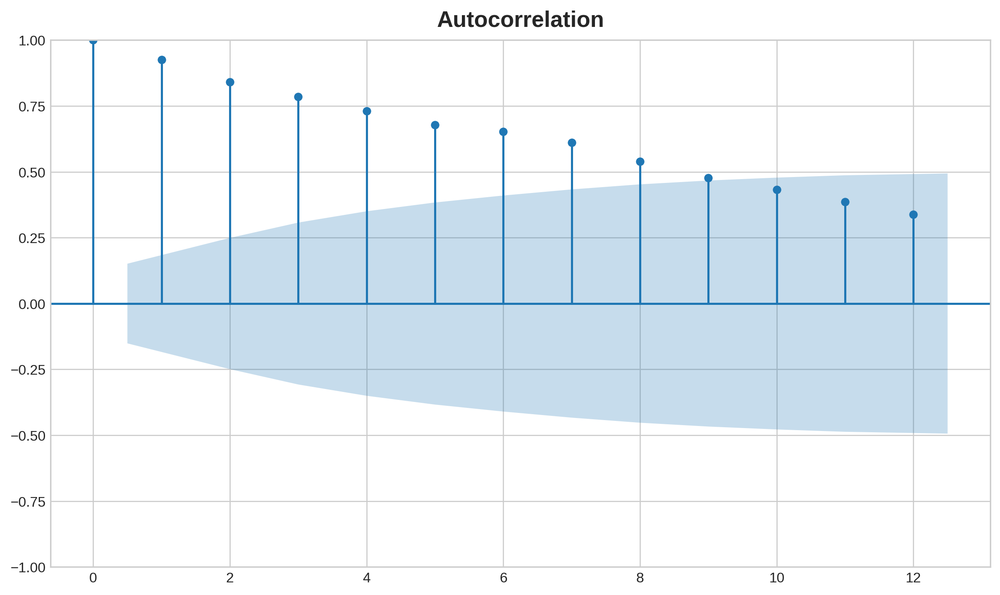

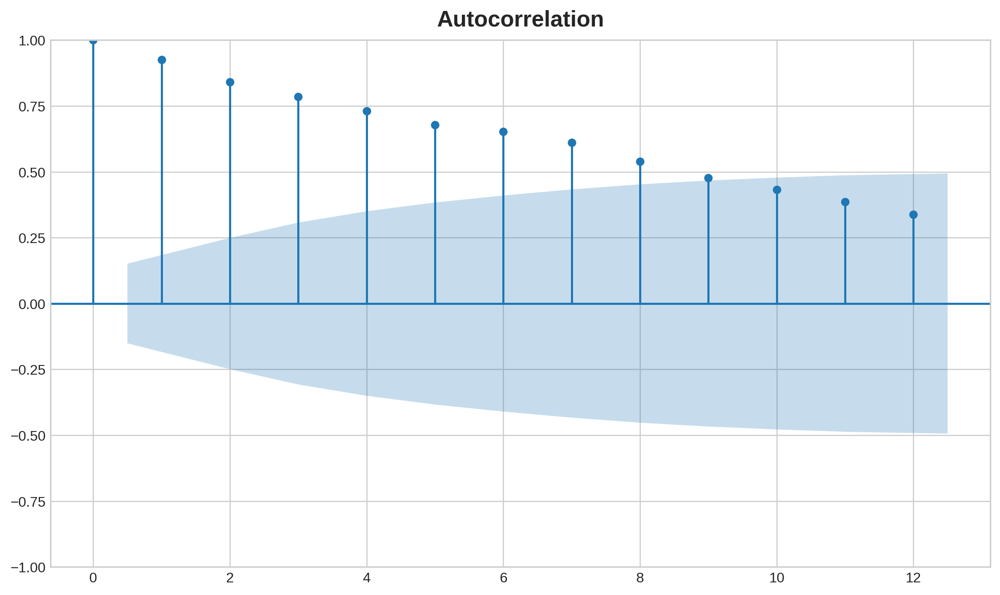

In [69]:
plot_acf(CropData_Summarized['Modal Price (Rs./Quintal)'],lags =12)

Q = 8

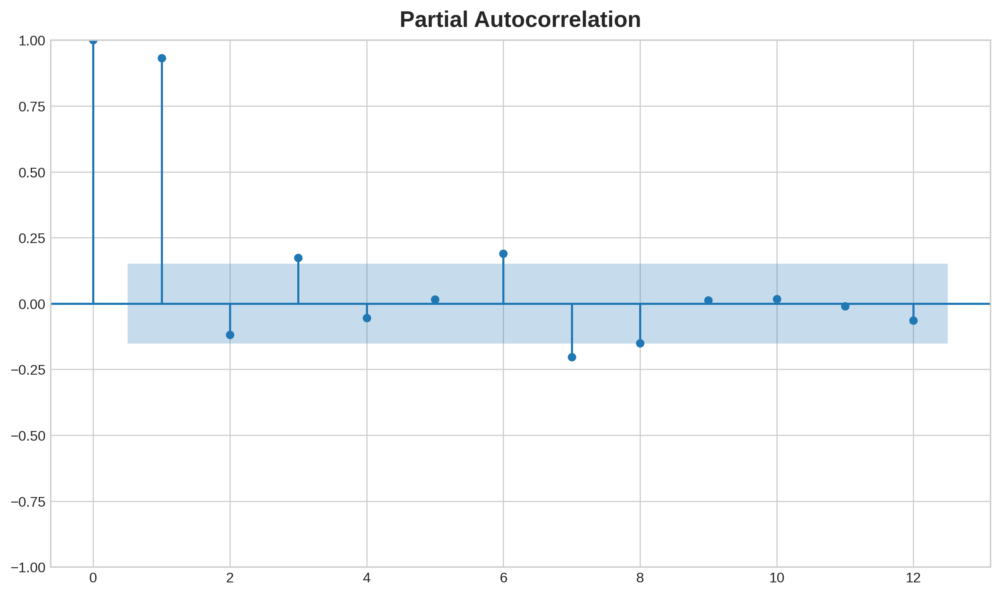

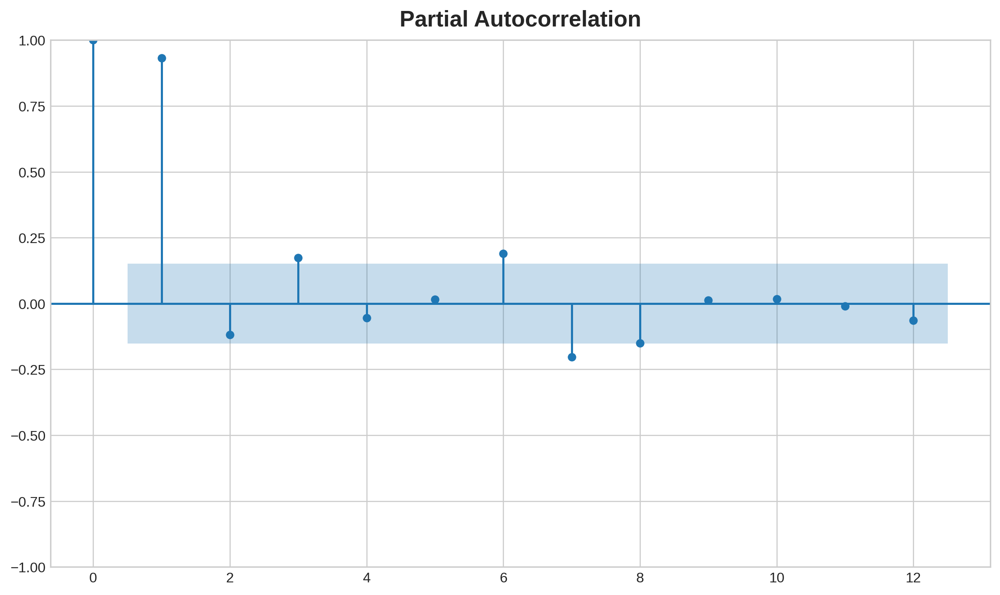

In [70]:
plot_pacf(CropData_Summarized['Modal Price (Rs./Quintal)'],lags = 12)

p = 1 

In [71]:
model = ARIMA(train_set,order = (1,1,8))
model_fit = model.fit()
model_fit.aic

1556.309814156721

In [72]:
pred = model_fit.forecast(steps = 51)

np.sqrt(mean_squared_error(test_set,pred))

2073.784348391138

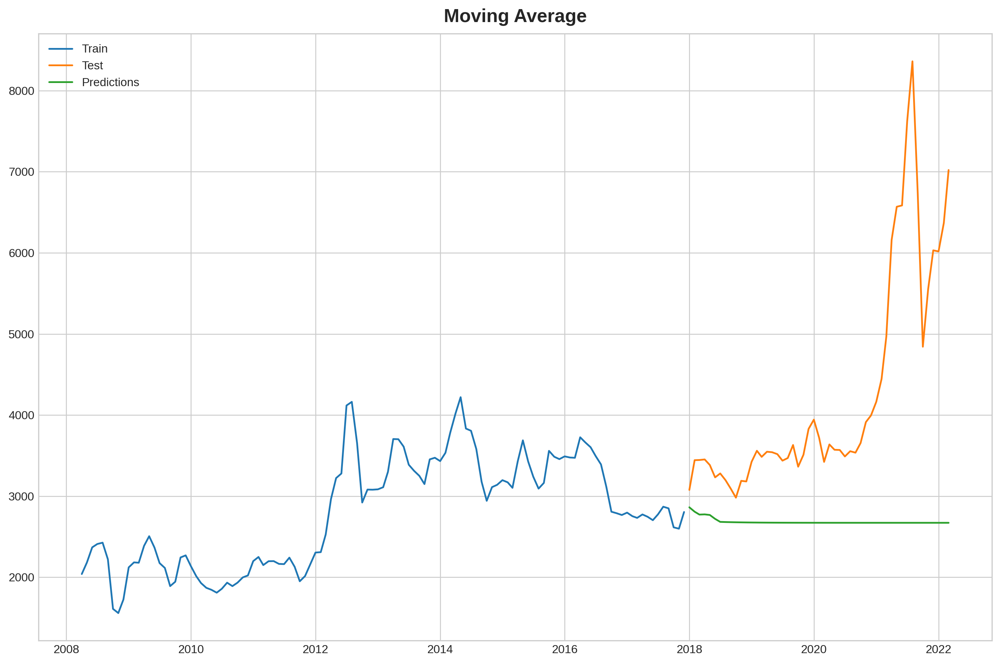

In [73]:
plt.figure(figsize=(12,8)) 
plt.plot(train_set.index, train_set['Modal Price (Rs./Quintal)'], label='Train') 
plt.plot(test_set.index,test_set['Modal Price (Rs./Quintal)'], label='Test') 
plt.plot(test_set.index,pred, label='Predictions') 
plt.legend(loc='best') 
plt.title("Moving Average") 
plt.show()

## Naive Forecast

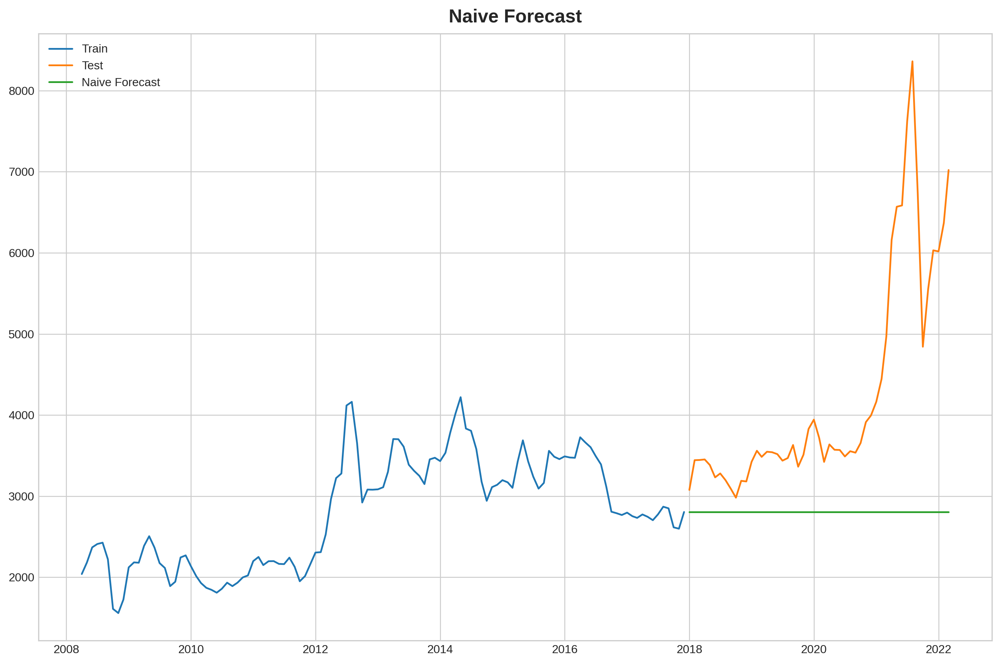

In [74]:
dd= np.asarray(train_set['Modal Price (Rs./Quintal)']) 
y_hat = test_set.copy() 
y_hat['naive'] = dd[len(dd)-1] 
plt.figure(figsize=(12,8)) 
plt.plot(train_set.index, train_set['Modal Price (Rs./Quintal)'], label='Train') 
plt.plot(test_set.index,test_set['Modal Price (Rs./Quintal)'], label='Test') 
plt.plot(y_hat.index,y_hat['naive'], label='Naive Forecast') 
plt.legend(loc='best') 
plt.title("Naive Forecast") 
plt.show()

In [75]:
rms = sqrt(mean_squared_error(test_set['Modal Price (Rs./Quintal)'], y_hat.naive)) 
print(rms)

1978.8166080678923


## Holt's Linear Trend Method


In [76]:
def holt(y,y_to_train,y_to_test,smoothing_level,smoothing_slope, predict_date):
    y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    fit1 = Holt(y_to_train).fit(smoothing_level, smoothing_slope, optimized=False)
    fcast1 = fit1.forecast(predict_date).rename("Holt's linear trend")
    mse1 = ((fcast1 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of Holt''s Linear trend {}'.format(round(np.sqrt(mse1), 2)))

    fit2 = Holt(y_to_train, exponential=True).fit(smoothing_level, smoothing_slope, optimized=False)
    fcast2 = fit2.forecast(predict_date).rename("Exponential trend")
    mse2 = ((fcast2 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of Holt''s Exponential trend {}'.format(round(np.sqrt(mse2), 2)))
    
    fit1.fittedvalues.plot(marker="o", color='blue')
    fcast1.plot(color='blue', marker="o", legend=True)
    fit2.fittedvalues.plot(marker="o", color='red')
    fcast2.plot(color='red', marker="o", legend=True)

    plt.show()

The Root Mean Squared Error of Holts Linear trend 2018-01-01 00:00:00         NaN
2018-02-01 00:00:00         NaN
2018-03-01 00:00:00         NaN
2018-04-01 00:00:00         NaN
2018-05-01 00:00:00         NaN
2018-06-01 00:00:00         NaN
2018-07-01 00:00:00         NaN
2018-08-01 00:00:00         NaN
2018-09-01 00:00:00         NaN
2018-10-01 00:00:00         NaN
2018-11-01 00:00:00         NaN
2018-12-01 00:00:00         NaN
2019-01-01 00:00:00         NaN
2019-02-01 00:00:00         NaN
2019-03-01 00:00:00         NaN
2019-04-01 00:00:00         NaN
2019-05-01 00:00:00         NaN
2019-06-01 00:00:00         NaN
2019-07-01 00:00:00         NaN
2019-08-01 00:00:00         NaN
2019-09-01 00:00:00         NaN
2019-10-01 00:00:00         NaN
2019-11-01 00:00:00         NaN
2019-12-01 00:00:00         NaN
2020-01-01 00:00:00         NaN
2020-02-01 00:00:00         NaN
2020-03-01 00:00:00         NaN
2020-04-01 00:00:00         NaN
2020-05-01 00:00:00         NaN
2020-06-01 00:00:00   

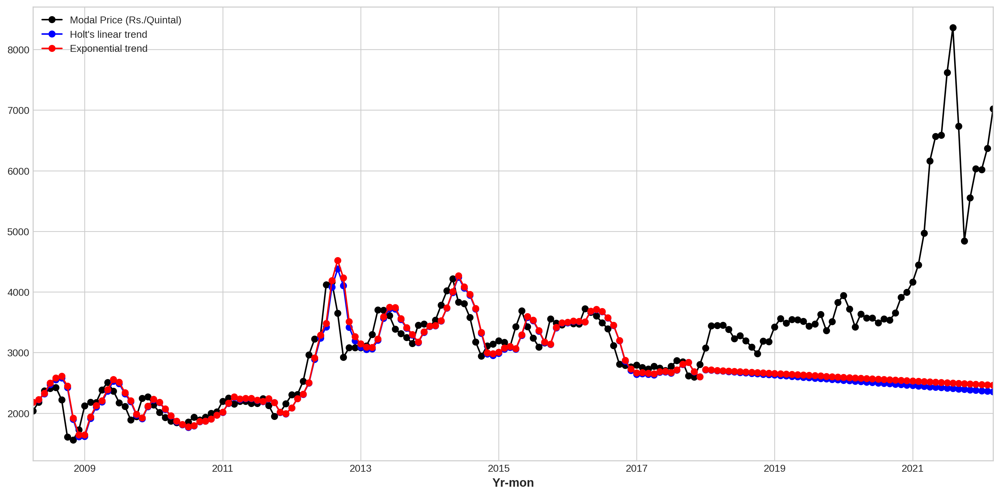

In [77]:
holt(shuffle_df, train_set,test_set,0.6,0.2,51)

## Holt's Exponential Smoothening

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


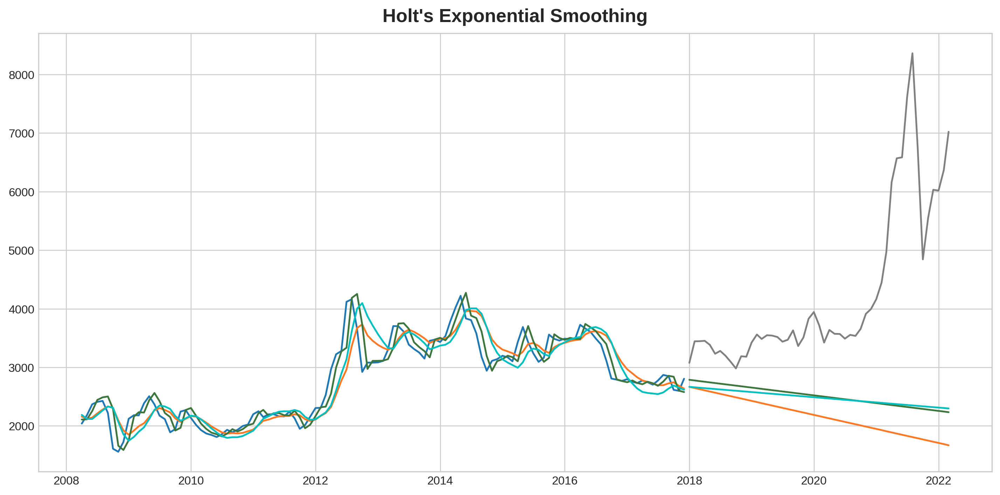

In [78]:
model = Holt(np.asarray(train_set['Modal Price (Rs./Quintal)']))
model.index = pd.to_datetime(train_set.index)

fit1 = model.fit(smoothing_level=.3, smoothing_slope=.05)
pred1 = fit1.forecast(51)
fit2 = model.fit(optimized=True)
pred2 = fit2.forecast(51)
fit3 = model.fit(smoothing_level=.3, smoothing_slope=.2)
pred3 = fit3.forecast(51)

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(train_set.index, train_set.values)
ax.plot(test_set.index, test_set.values, color="gray")
for p, f, c in zip((pred1, pred2, pred3),(fit1, fit2, fit3),('#ff7823','#3c763d','c')):
    ax.plot(train_set.index, f.fittedvalues, color=c)
    ax.plot(test_set.index, p, color=c)
plt.title("Holt's Exponential Smoothing")
plt.legend()

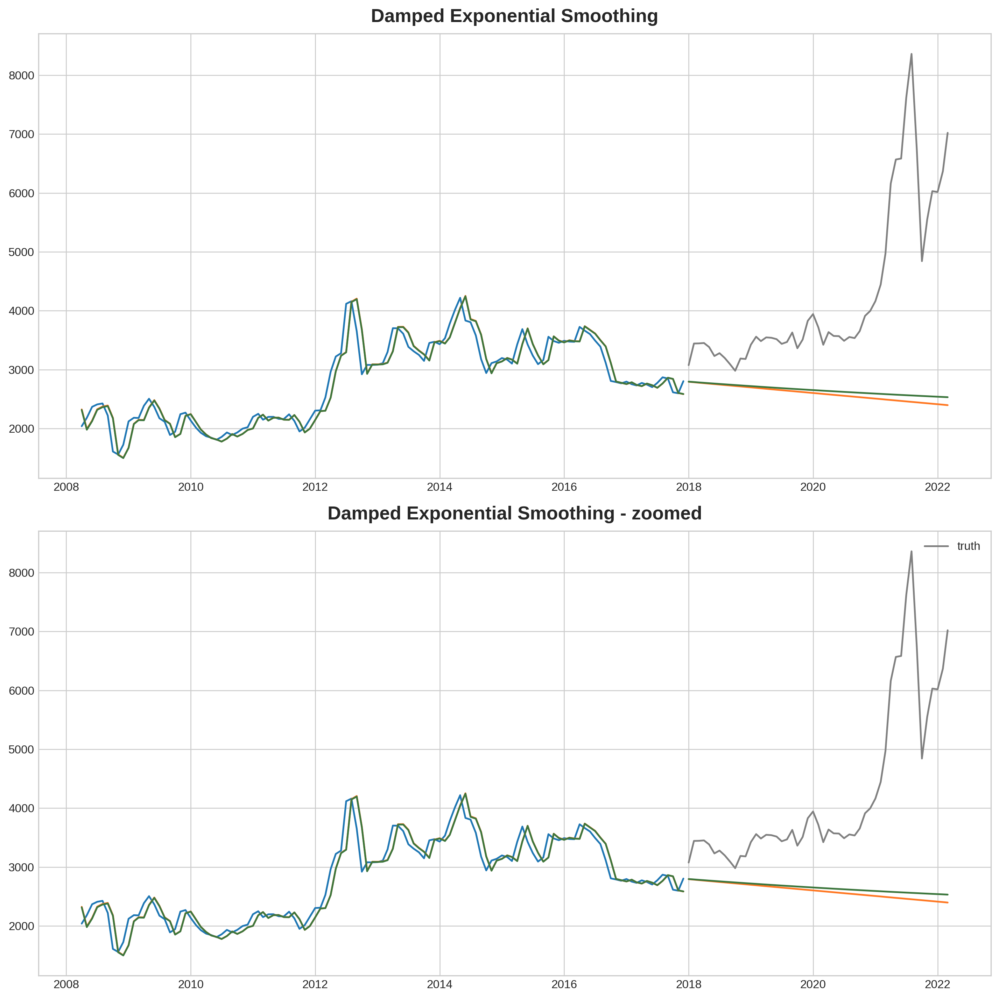

In [79]:
model = ExponentialSmoothing(np.asarray(train_set['Modal Price (Rs./Quintal)']), trend='add', seasonal=None)
model2 = ExponentialSmoothing(np.asarray(train_set['Modal Price (Rs./Quintal)']), trend='add', seasonal=None, damped=True)
model.index = pd.to_datetime(train_set.index)

fit1 = model.fit()
fit2 = model2.fit()
pred1 = fit1.forecast(51)
pred2 = fit2.forecast(51)

fig, ax = plt.subplots(2, figsize=(12, 12))
ax[0].plot(train_set.index, train_set.values)
ax[0].plot(test_set.index, test_set.values, color="gray", label="truth")
ax[1].plot(train_set.index, train_set.values)
ax[1].plot(test_set.index, test_set.values, color="gray", label="truth")
for p, f, c in zip((pred1, pred2),(fit1, fit2),('#ff7823','#3c763d')):
    ax[0].plot(train_set.index, f.fittedvalues, color=c)
    ax[1].plot(train_set.index, f.fittedvalues, color=c)
    ax[0].plot(test_set.index, p, color=c)
    ax[1].plot(test_set.index, p, color=c)
ax[0].set_title("Damped Exponential Smoothing");
ax[1].set_title("Damped Exponential Smoothing - zoomed");
plt.legend()

Text(0.5, 1.0, "Holt-Winter's Seasonal Smoothing")

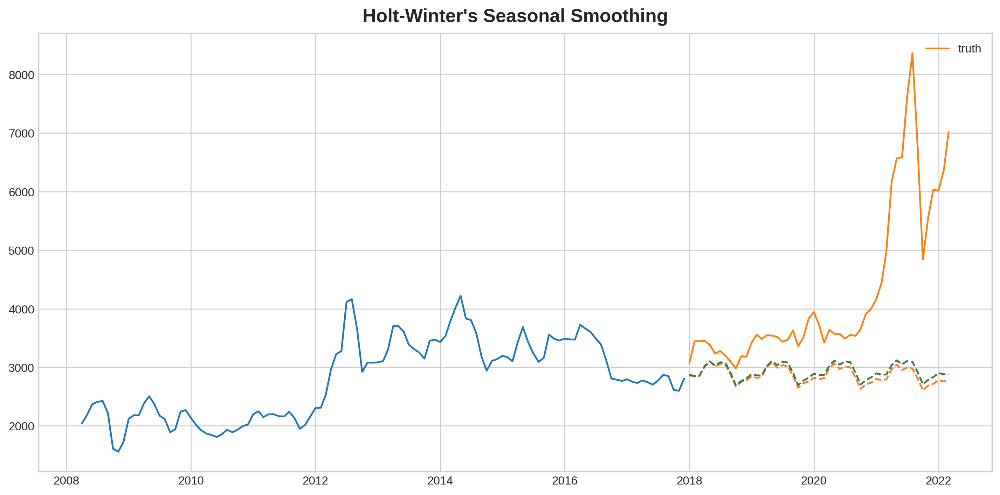

In [80]:

model = ExponentialSmoothing(train_set, trend="add", seasonal="add", seasonal_periods=12)
model2 = ExponentialSmoothing(train_set, trend="add", seasonal="add", seasonal_periods=12, damped=True)
fit = model.fit()
pred = fit.forecast(51)
fit2 = model2.fit()
pred2 = fit2.forecast(51)

sse1 = np.sqrt(np.mean(np.square(test_set.values - pred.values)))
sse2 = np.sqrt(np.mean(np.square(test_set.values - pred2.values)))

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(train_set.index, train_set.values);
ax.plot(test_set.index, test_set.values, label='truth');
ax.plot(test_set.index, pred, linestyle='--', color='#ff7823')
ax.plot(test_set.index, pred2, linestyle='--', color='#3c763d') 
ax.legend();
ax.set_title("Holt-Winter's Seasonal Smoothing")

## Auto Regression Model

We consider only the pacf for AR model


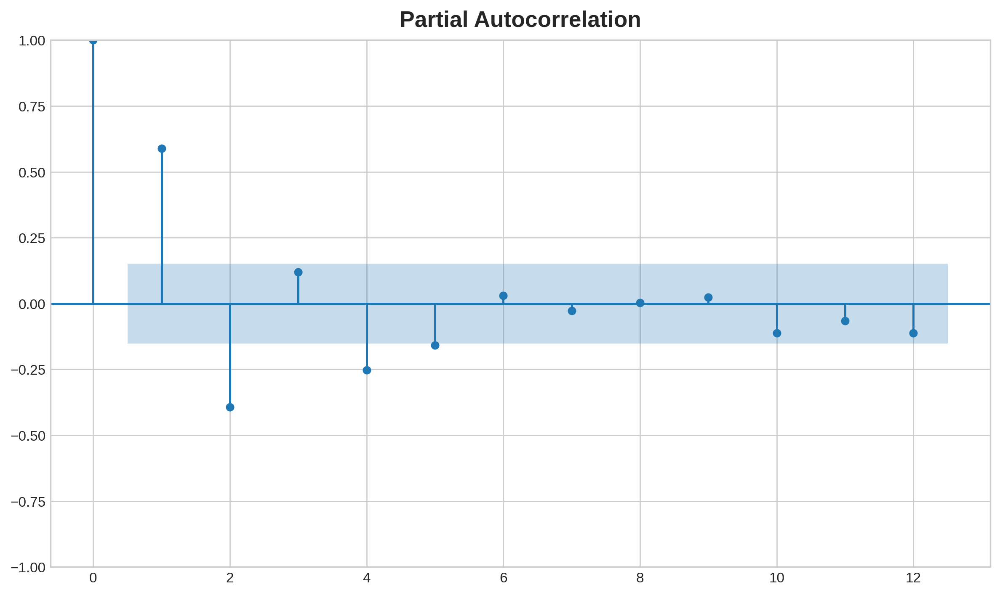

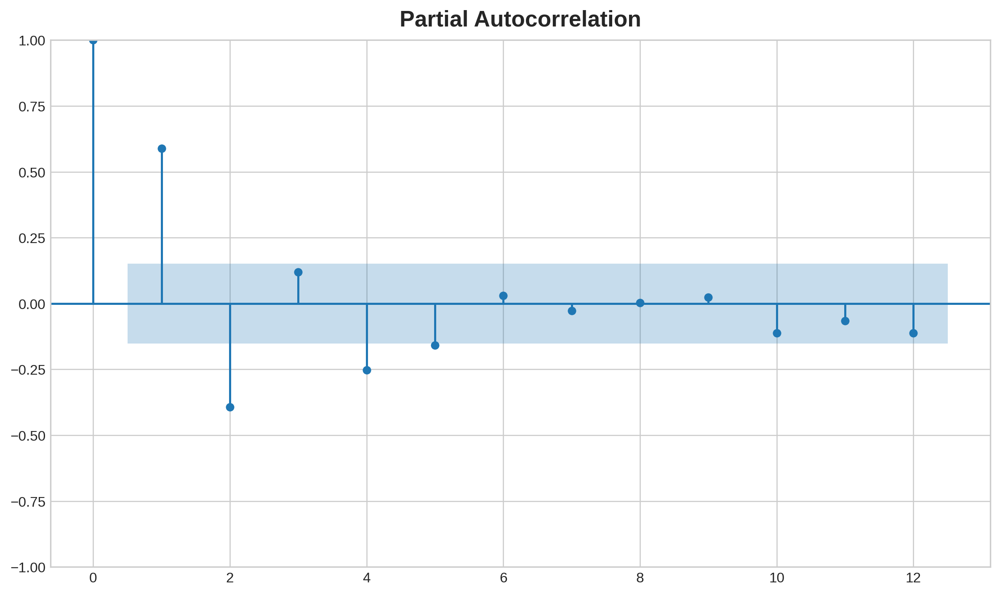

In [81]:
plot_pacf(CropData_Summarized['Stationary'],lags = 12)

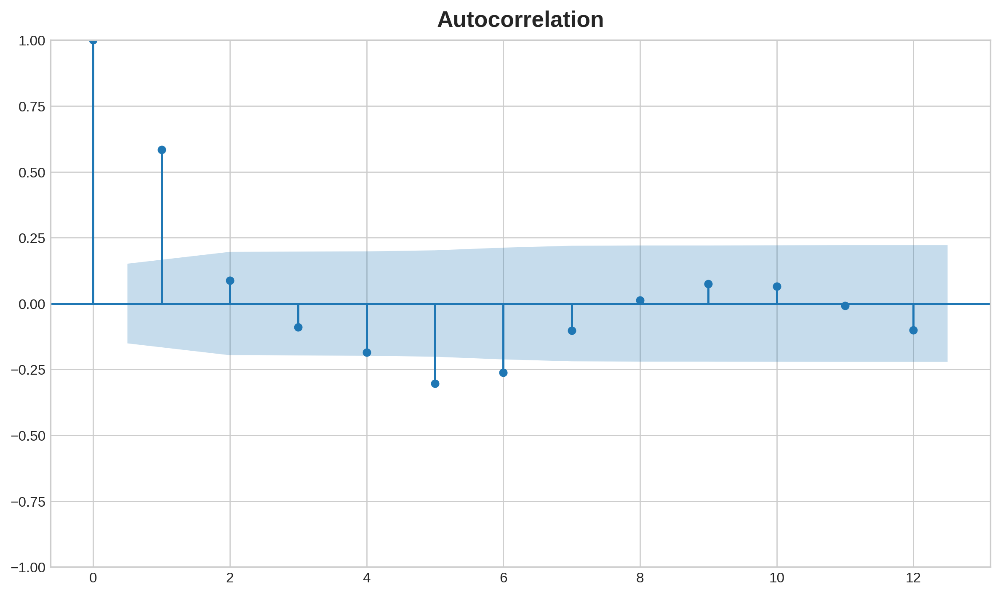

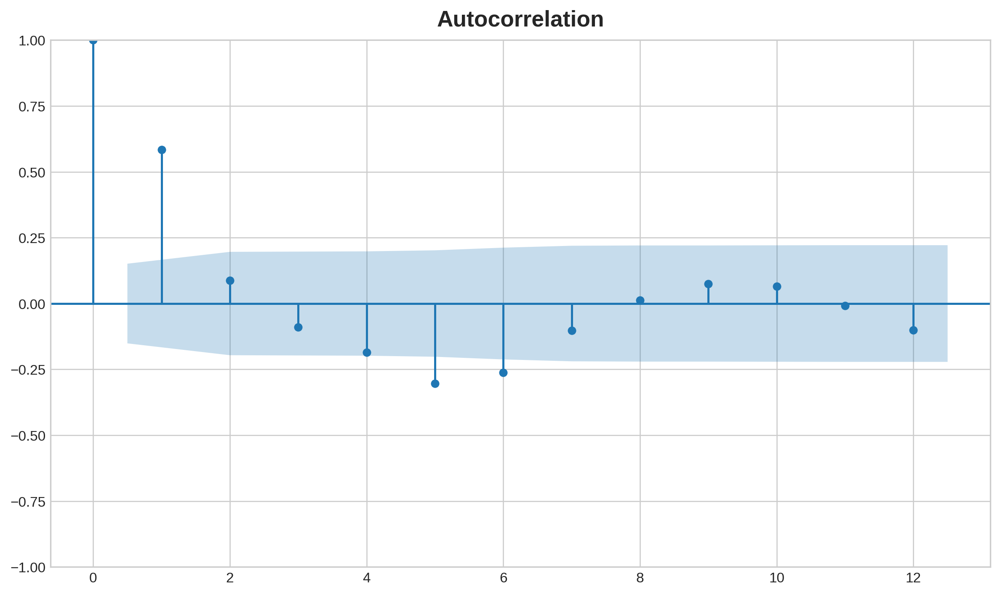

In [82]:
plot_acf(CropData_Summarized['Stationary'],lags = 12)

In [83]:
train = CropData_Summarized['Stationary'][:train_size]
test = CropData_Summarized['Stationary'][train_size:]

In [84]:
ar_model_1 = AutoReg(train,lags=2).fit()
print(ar_model_1.summary())

                            AutoReg Model Results                             
Dep. Variable:             Stationary   No. Observations:                  117
Model:                     AutoReg(2)   Log Likelihood                -729.725
Method:               Conditional MLE   S.D. of innovations            137.896
Date:                Wed, 26 Oct 2022   AIC                           1467.450
Time:                        11:04:51   BIC                           1478.430
Sample:                    06-01-2008   HQIC                          1471.907
                         - 12-01-2017                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -1.7359     12.861     -0.135      0.893     -26.943      23.471
Stationary.L1     0.9593      0.082     11.701      0.000       0.799       1.120
Stationary.L2    -0.4787      0.082     

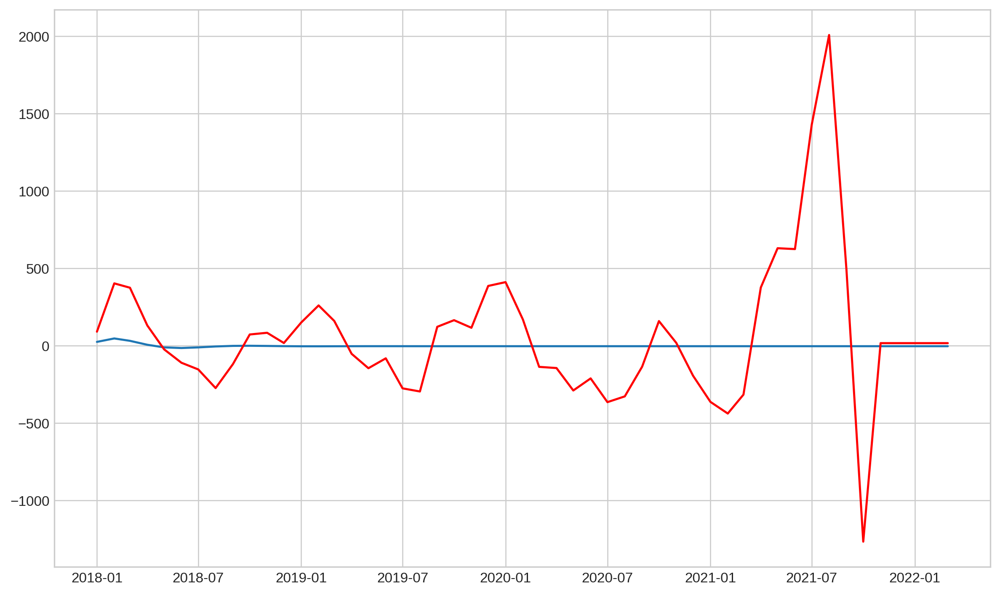

In [85]:
pred = ar_model_1.predict(start=len(train), end=(len(CropData_Summarized['Stationary'])-1), dynamic=False)
plt.plot(pred)
plt.plot(test, color='red')

In [86]:
rmse = sqrt(mean_squared_error(test,pred))
print(rmse)

462.02492761461485


In [87]:
pred_future = ar_model_1.predict(start = len(CropData_Summarized['Stationary']) + 1  , end = len(CropData_Summarized['Stationary'])+7 , dynamic = False)
print(pred_future)

2022-05-01   -3.342132
2022-06-01   -3.342132
2022-07-01   -3.342132
2022-08-01   -3.342132
2022-09-01   -3.342132
2022-10-01   -3.342132
2022-11-01   -3.342132
Freq: MS, dtype: float64


In [88]:
ar_model_2 = AutoReg(train_set, lags=12).fit()
print(ar_model_2.summary())

                                AutoReg Model Results                                
Dep. Variable:     Modal Price (Rs./Quintal)   No. Observations:                  117
Model:                           AutoReg(12)   Log Likelihood                -689.180
Method:                      Conditional MLE   S.D. of innovations            171.516
Date:                       Wed, 26 Oct 2022   AIC                           1406.360
Time:                               11:04:52   BIC                           1443.515
Sample:                           04-01-2009   HQIC                          1421.416
                                - 12-01-2017                                         
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                           134.8293     81.068      1.663      0.096     -24.060     293.719
Modal Price (Rs./Q

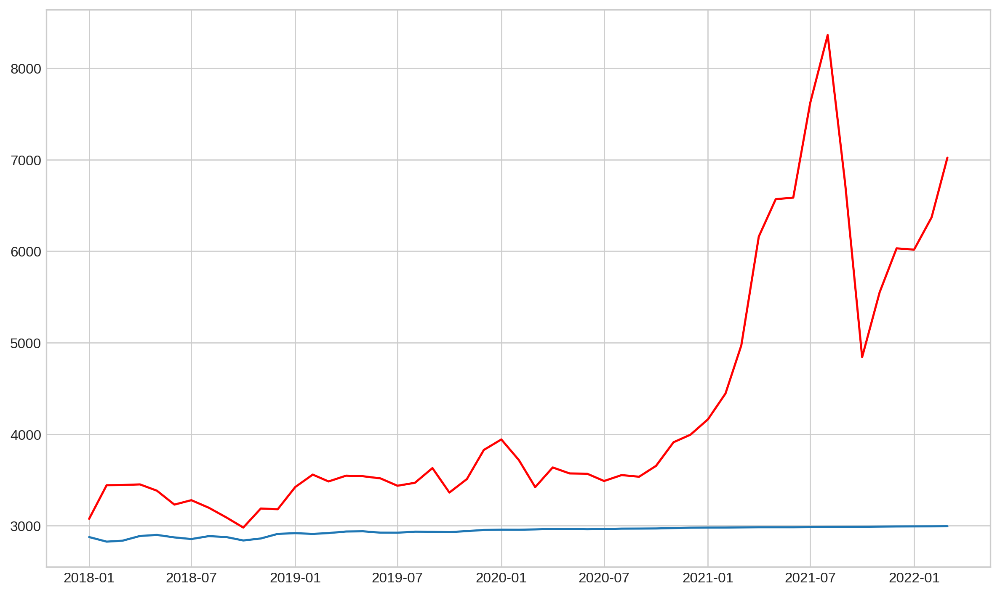

In [89]:
pred = ar_model_2.predict(start=len(train_set), end=(len(shuffle_df)-1), dynamic=False)

plt.plot(pred)

plt.plot(test_set, color='red')

In [90]:
rmse = sqrt(mean_squared_error(test_set,pred))
print(rmse)

1859.3661944895468


In [91]:
pred_future = ar_model_2.predict(start = len(CropData_Summarized['Stationary']) + 1  , end = len(CropData_Summarized['Stationary'])+7 , dynamic = False)
print(pred_future)


2022-05-01    2996.081207
2022-06-01    2996.552282
2022-07-01    2997.445045
2022-08-01    2998.275179
2022-09-01    2998.862309
2022-10-01    2999.486766
2022-11-01    3000.230852
Freq: MS, dtype: float64


## ARMA 

In [92]:
start_date = datetime.date(2008,4,1)
end_date = datetime.date(2022,4,1)

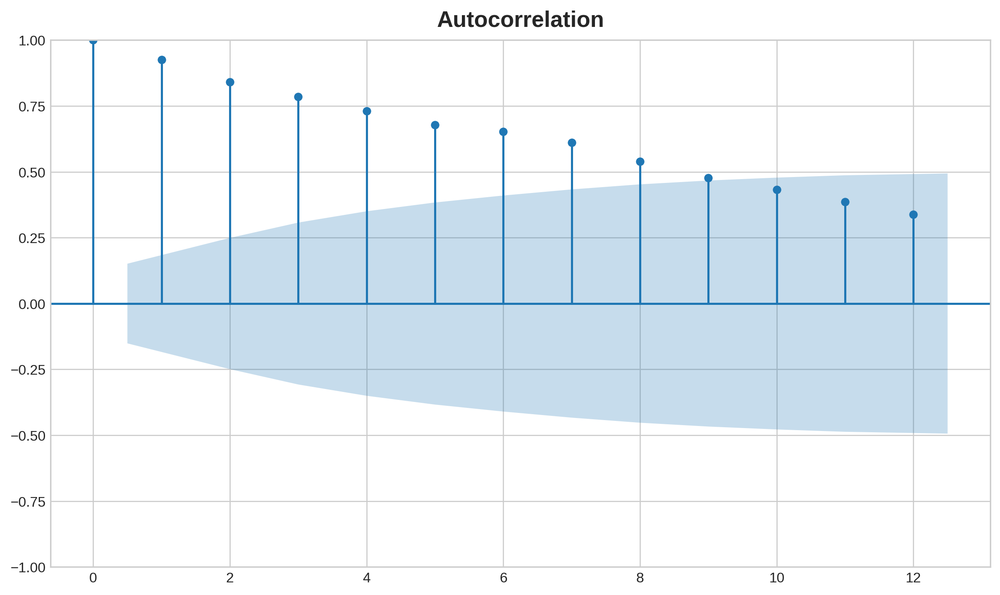

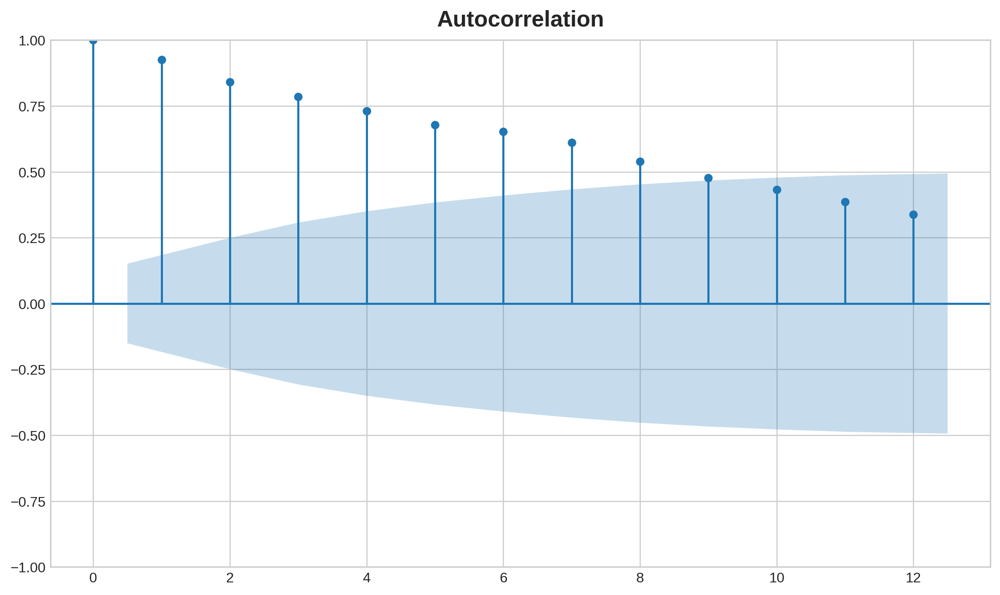

In [93]:
plot_acf(CropData_Summarized['Modal Price (Rs./Quintal)'],lags = 12)

MA model - 8

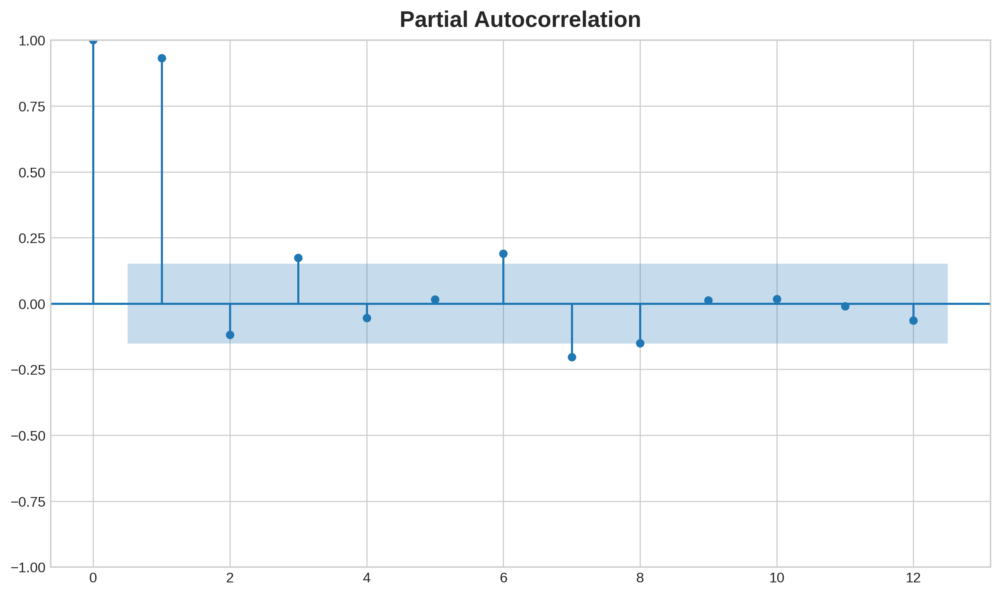

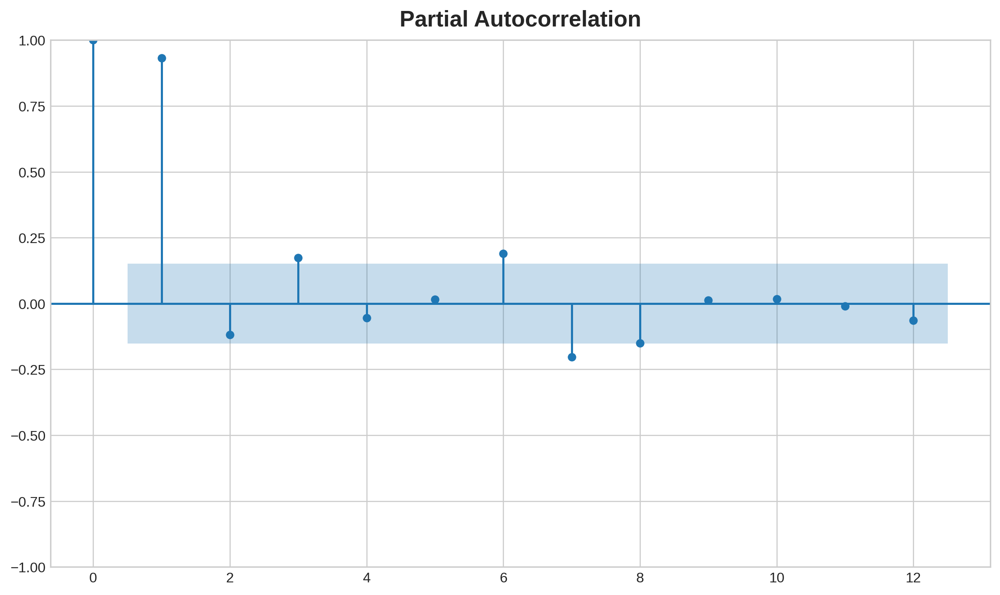

In [94]:
plot_pacf(CropData_Summarized['Modal Price (Rs./Quintal)'],lags = 12)

AR model - 1

ARMA - 1,8

In [95]:
model = ARIMA(train_set,order = (1,0,9))
model_fit = model.fit()
model_fit.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                   SARIMAX Results                                   
=====================================================================================
Dep. Variable:     Modal Price (Rs./Quintal)   No. Observations:                  117
Model:                        ARIMA(1, 0, 9)   Log Likelihood                -773.984
Date:                       Wed, 26 Oct 2022   AIC                           1571.969
Time:                               11:04:54   BIC                           1605.115
Sample:                           04-01-2008   HQIC                          1585.426
                                - 12-01-2017                                         
Covariance Type:                         opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2799.2631    410.492      6.819      0.000    1994.714    3603.813
ar.L1          0.9696      0.037     26.317      0.000       0.897       1.042
ma.L1          0.3701      0.100      3.705      0.000       0.174       0.566
ma.L2         -0.1079      0.113     -0.952      0.341      -0.330       0.114
ma.L3         -0.2684      0.087     -3.068      0.002      -0.440      -0.097
ma.L4         -0.0429      0.088     -0.490      0.624      -0.215       0.129
ma.L5         -0.0376      0.120     -0.314      0.754      -0.272       0.197
ma.L6         -0.1193      0.134     -0.890      0.373      -0.382       0.143
ma.L7         -0.1702      0.136     -1.252      0.210      -0.437       0.096
ma.L8          0.0269      0.155      0.174      0.862      -0.277       0.331
ma.L9          0.1893      0.126      1.502      0.133      -0.058       0.436
sigma2      3.169e+04   3069.732     10.323      0.000    2.57e+04    3.77e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               179.46
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               1.01   Skew:                             1.12
Prob(H) (two-sided):                  0.99   Kurtosis:                         8.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Text(0, 0.5, 'Yr-mon')

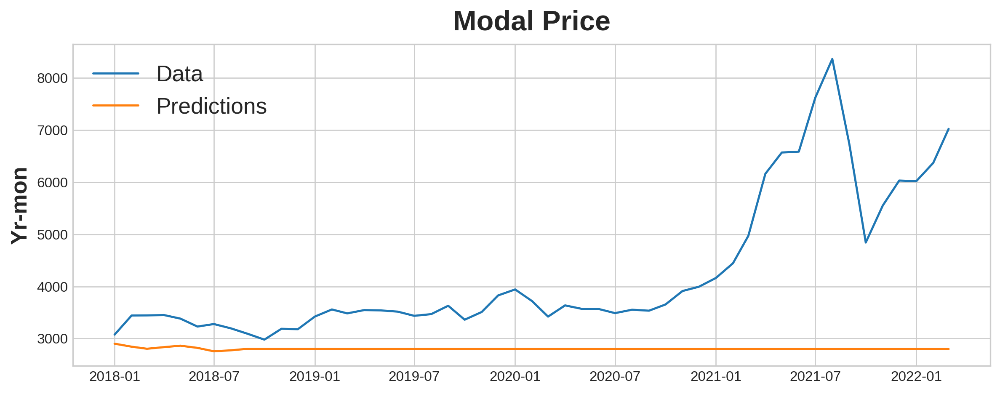

In [96]:
pred = model_fit.predict(start = test_set.index[0] , end = test_set.index[-1])
residuals = test_set - pred

plt.figure(figsize=(10,4))
plt.plot(test_set)
plt.plot(pred)

plt.legend(('Data', 'Predictions'), fontsize=16)
plt.title('Modal Price', fontsize=20)
plt.ylabel('Yr-mon', fontsize=16)


## ARIMA

In [97]:
stepwise_fit = auto_arima(CropData_Summarized['Stationary'],trace= True,suppress_warnings=True)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2404.532, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2336.676, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2315.121, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2403.012, Time=0.01 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2309.273, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=2309.167, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=2311.971, Time=0.03 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=2311.163, Time=0.13 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2307.252, Time=0.11 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2306.675, Time=0.12 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=2307.237, Time=0.09 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2304.855, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  168
Model:               SARIMAX(1, 0, 3)   Log Likelihood               -1144.686
Date:                Wed, 26 Oct 2022   AIC                           2299.373
Time:                        11:04:58   BIC                           2314.993
Sample:                    04-01-2008   HQIC                          2305.712
                         - 03-01-2022                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8138      0.082      9.985      0.000       0.654       0.974
ma.L1          0.0267      0.086      0.309      0.757      -0.143       0.196
ma.L2         -0.5857      0.081     -7.239      0.000      -0.744      -0.427
ma.L3         -0.3827      0.042     -9.031      0.000      -0.466      -0.300
sigma2      4.799e+04   2558.008     18.761      0.000     4.3e+04     5.3e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               917.30
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               5.24   Skew:                             2.17
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [98]:
arima_model = ARIMA(train,order = (1,0,1))
arima_model = arima_model.fit()
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             Stationary   No. Observations:                  117
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -746.978
Date:                Wed, 26 Oct 2022   AIC                           1501.957
Time:                        11:04:58   BIC                           1513.005
Sample:                    04-01-2008   HQIC                          1506.442
                         - 12-01-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.7961     40.143     -0.095      0.925     -82.476      74.884
ar.L1          0.4445      0.116      3.842      0.000       0.218       0.671
ma.L1          0.4638      0.109      4.273      0.000       0.251       0.677
sigma2      2.041e+04   1560.022     13.084      0.000    1.74e+04    2.35e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.47   Jarque-Bera (JB):               186.24
Prob(Q):                              0.49   Prob(JB):                         0.00
Heteroskedasticity (H):               1.23   Skew:                             1.29
Prob(H) (two-sided):                  0.52   Kurtosis:                         8.61
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [99]:
pred = arima_model.predict(start = len(train),end=len(CropData_Summarized['Stationary'])-1,typ = 'levels')

<AxesSubplot: xlabel='Yr-mon'>

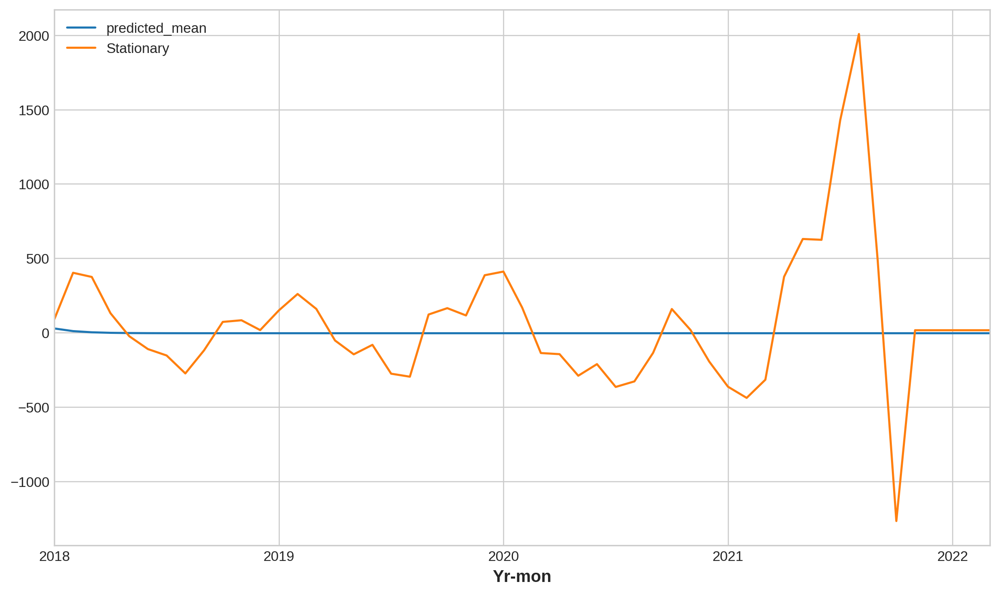

In [100]:
pred.plot(legend = True)
test.plot(legend = True)

In [101]:
rmse = sqrt(mean_squared_error(test,pred))
print(rmse)

463.229419008712


## SARIMA

In [102]:
my_order = (0,1,2)
my_seasonal_order = (1,0,2,12)

model = SARIMAX(train_set,order=my_order,seasonal_order=my_seasonal_order)

In [103]:
model_fit = model.fit()
model_fit.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.59913D+00    |proj g|=  9.88317D-02

At iterate    5    f=  6.58519D+00    |proj g|=  8.66406D-03

At iterate   10    f=  6.57045D+00    |proj g|=  2.02461D-02

At iterate   15    f=  6.56555D+00    |proj g|=  5.90035D-03


 This problem is unconstrained.



At iterate   20    f=  6.56492D+00    |proj g|=  6.32391D-04

At iterate   25    f=  6.56482D+00    |proj g|=  5.09935D-03

At iterate   30    f=  6.56030D+00    |proj g|=  2.88899D-02

At iterate   35    f=  6.55950D+00    |proj g|=  1.70012D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    6     37     43      1     0     0   1.199D-04   6.559D+00
  F =   6.5594997885182584     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:          Modal Price (Rs./Quintal)   No. Observations:                  117
Model:             SARIMAX(0, 1, 2)x(1, 0, 2, 12)   Log Likelihood                -767.461
Date:                            Wed, 26 Oct 2022   AIC                           1546.923
Time:                                    11:04:59   BIC                           1563.444
Sample:                                04-01-2008   HQIC                          1553.630
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3724      0.075      4.959      0.000       0.225       0.520
ma.L2          0.0107      0.068      0.157      0.875      -0.122       0.144
ar.S.L12       0.9990      0.008    129.782      0.000       0.984       1.014
ma.S.L12      -1.0306      0.136     -7.589      0.000      -1.297      -0.764
ma.S.L24       0.0530      0.117      0.452      0.651      -0.177       0.283
sigma2      2.909e+04   5.04e-06   5.77e+09      0.000    2.91e+04    2.91e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                87.87
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               1.07   Skew:                             0.57
Prob(H) (two-sided):                  0.83   Kurtosis:                         7.11
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.47e+24. Standard errors may be unstable.
"""

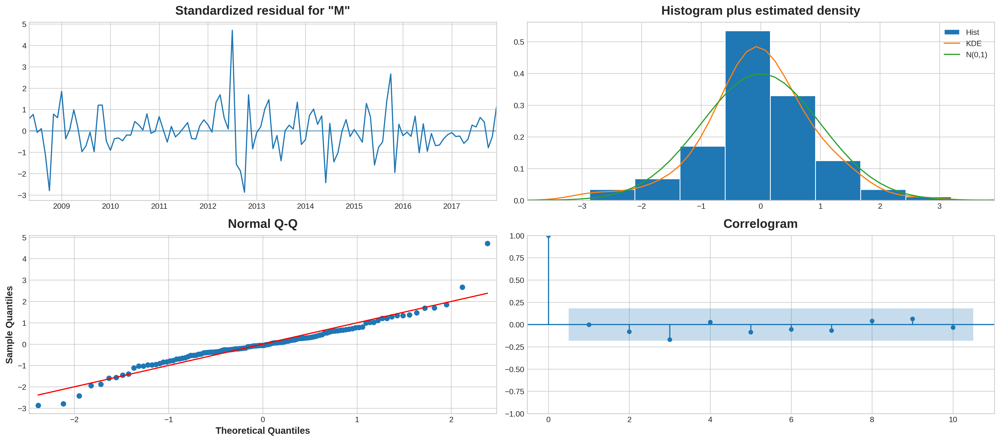

In [104]:
model_fit.plot_diagnostics(figsize=(18, 8))
plt.show()

In [105]:
pred = model_fit.forecast(len(test_set))
pred = pd.Series(pred, index=test_set.index)
residuals = test_set - pred

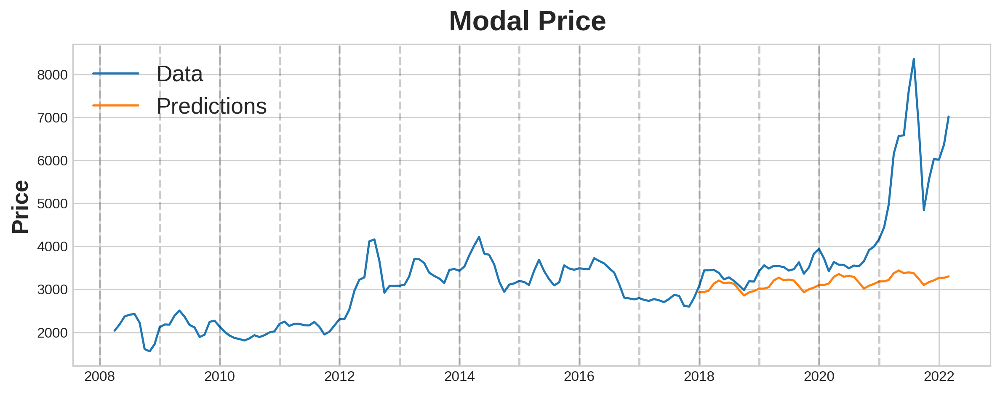

In [106]:
start_date = datetime.date(2008,4,1)
end_date = datetime.date(2022,4,1)

plt.figure(figsize=(10,4))

plt.plot(CropData_Summarized['Modal Price (Rs./Quintal)'])
plt.plot(pred)

plt.legend(('Data', 'Predictions'), fontsize=16)

plt.title('Modal Price ', fontsize=20)
plt.ylabel('Price', fontsize=16)
for year in range(start_date.year,end_date.year):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

## Facebook Prophet library

In [107]:
fbdf = pd.DataFrame()
fbdf = pd.DataFrame(CropData_Summarized['Modal Price (Rs./Quintal)'])
fbdf.reset_index(inplace=True)
fbdf.columns = ['ds','y']

In [108]:
train_fb = fbdf[:train_size]
test_fb = fbdf[train_size:]

In [109]:
model = Prophet(weekly_seasonality=True,daily_seasonality=True)
model.fit(train_fb)
future = model.make_future_dataframe(periods=51,freq='M')
forecast = model.predict(future)

Initial log joint probability = -3.46327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       212.765    0.00127822       99.9823   1.472e-05       0.001      163  LS failed, Hessian reset 
      99       212.898   0.000422847       47.7591      0.7397      0.1783      174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       212.934   4.24621e-09       58.7083      0.0107           1      266   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


In [110]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
163,2021-10-31,2546.326839,1791.751702,2841.329108,2276.132380,2823.409309,-267.963289,-267.963289,-267.963289,-211.294257,...,85.041198,85.041198,85.041198,-141.710230,-141.710230,-141.710230,0.0,0.0,0.0,2278.363551
164,2021-11-30,2533.790278,1679.711390,2759.058686,2255.407697,2819.080870,-322.950968,-322.950968,-322.950968,-211.294257,...,23.431038,23.431038,23.431038,-135.087749,-135.087749,-135.087749,0.0,0.0,0.0,2210.839310
165,2021-12-31,2520.835831,1720.085467,2796.888764,2236.043614,2815.062400,-266.933042,-266.933042,-266.933042,-211.294257,...,80.659892,80.659892,80.659892,-136.298677,-136.298677,-136.298677,0.0,0.0,0.0,2253.902789
166,2022-01-31,2507.881385,1627.180650,2720.743783,2209.960183,2810.844603,-327.312149,-327.312149,-327.312149,-211.294257,...,-14.676687,-14.676687,-14.676687,-101.341206,-101.341206,-101.341206,0.0,0.0,0.0,2180.569235
167,2022-02-28,2496.180594,1656.268365,2712.373758,2191.663251,2806.778108,-296.028844,-296.028844,-296.028844,-211.294257,...,-14.676687,-14.676687,-14.676687,-70.057900,-70.057900,-70.057900,0.0,0.0,0.0,2200.151750


In [111]:
plot_plotly(model,forecast,plot_cap=False)

In [112]:
plot_components_plotly(model,forecast)

## SARIMAX

In [113]:
model = auto_arima(train_set, m =12)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  117
Model:             SARIMAX(0, 1, 3)x(2, 0, [], 12)   Log Likelihood                -767.700
Date:                             Wed, 26 Oct 2022   AIC                           1547.399
Time:                                     11:05:14   BIC                           1563.921
Sample:                                 04-01-2008   HQIC                          1554.106
                                      - 12-01-2017                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3473      0.092      3.763      0.000       0.166       0.528
ma.L2         -0.1412      0.090     -1.568      0.117      -0.318       0.035
ma.L3         -0.2329      0.069     -3.358      0.001      -0.369      -0.097
ar.S.L12       0.1320      0.085      1.550      0.121      -0.035       0.299
ar.S.L24       0.1685      0.122      1.378      0.168      -0.071       0.408
sigma2      3.243e+04   2813.494     11.527      0.000    2.69e+04    3.79e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):               113.04
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               1.04   Skew:                             0.69
Prob(H) (two-sided):                  0.91   Kurtosis:                         7.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [114]:
pred = model.predict(n_periods=51)
pred.index = test_set.index
pred

Yr-mon
2018-01-01    2903.239813
2018-02-01    2852.274359
2018-03-01    2814.740528
2018-04-01    2862.963550
2018-05-01    2848.557318
2018-06-01    2832.979020
2018-07-01    2823.891426
2018-08-01    2819.142561
2018-09-01    2770.316440
2018-10-01    2687.286750
2018-11-01    2681.919769
2018-12-01    2705.432503
2019-01-01    2723.406779
2019-02-01    2709.308173
2019-03-01    2700.805036
2019-04-01    2714.330453
2019-05-01    2707.652572
2019-06-01    2698.428296
2019-07-01    2709.271688
2019-08-01    2724.621296
2019-09-01    2714.768238
2019-10-01    2664.336285
2019-11-01    2660.816933
2019-12-01    2698.580487
2020-01-01    2717.634707
2020-02-01    2707.183743
2020-03-01    2699.735236
2020-04-01    2709.648321
2020-05-01    2706.338707
2020-06-01    2702.495390
2020-07-01    2702.395260
2020-08-01    2703.621272
2020-09-01    2694.091349
2020-10-01    2673.439706
2020-11-01    2672.070545
2020-12-01    2681.018761
2021-01-01    2686.563603
2021-02-01    2682.807731
2021-

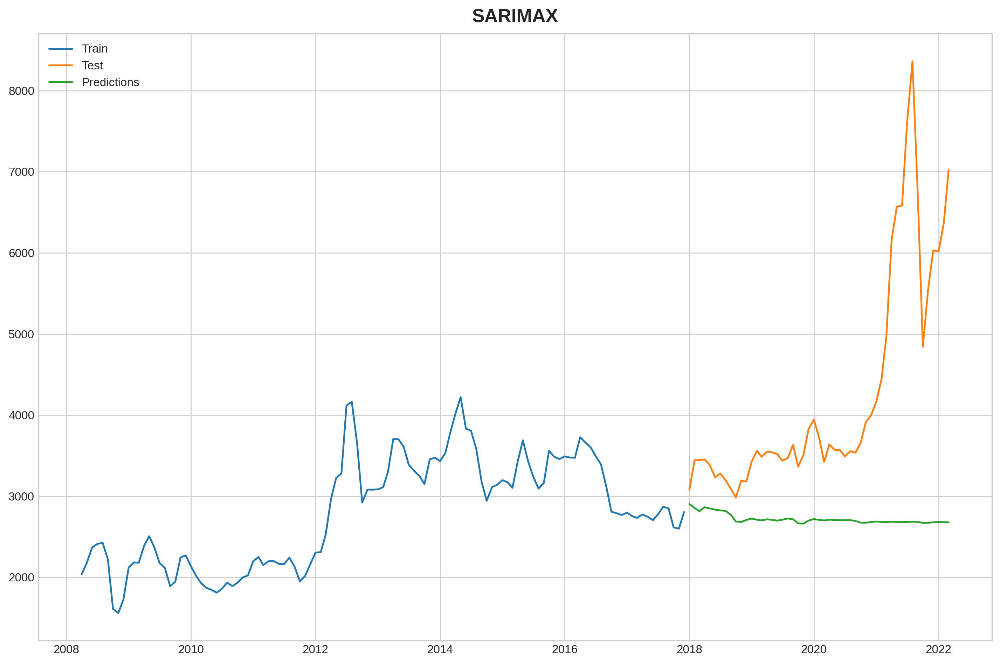

In [115]:
plt.figure(figsize=(12,8)) 
plt.plot(train_set.index, train_set['Modal Price (Rs./Quintal)'], label='Train') 
plt.plot(test_set.index,test_set['Modal Price (Rs./Quintal)'], label='Test') 
plt.plot(pred.index,pred, label='Predictions') 
plt.legend(loc='best') 
plt.title("SARIMAX") 
plt.show()

## Recurrent Neural Network

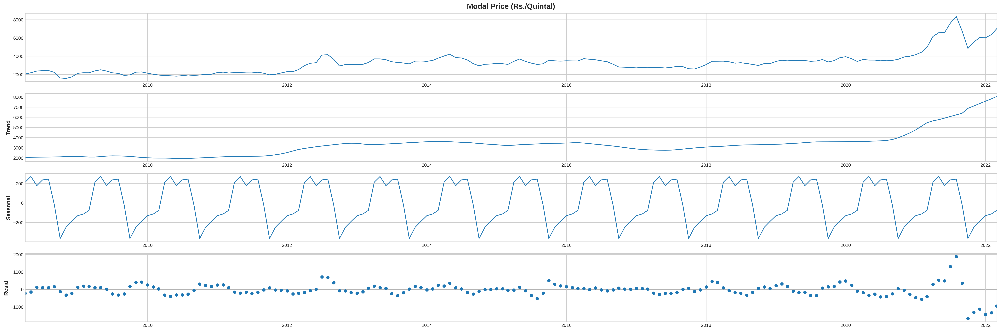

In [116]:
seasonal_decompose_add(CropData_Summarized['Modal Price (Rs./Quintal)'])


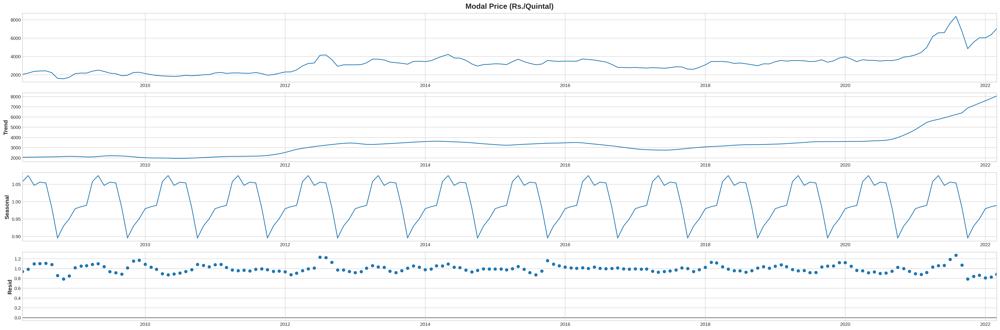

In [117]:
seasonal_decompose_mul(CropData_Summarized['Modal Price (Rs./Quintal)'])


### Min Max Scaler

In [118]:
train_set,test_set

(            Modal Price (Rs./Quintal)
 Yr-mon                               
 2008-04-01                2039.881656
 2008-05-01                2181.964961
 2008-06-01                2368.407317
 2008-07-01                2409.957051
 2008-08-01                2426.321804
 ...                               ...
 2017-08-01                2869.704679
 2017-09-01                2849.488420
 2017-10-01                2615.296589
 2017-11-01                2598.619102
 2017-12-01                2804.264414
 
 [117 rows x 1 columns],
             Modal Price (Rs./Quintal)
 Yr-mon                               
 2018-01-01                3076.752363
 2018-02-01                3443.592532
 2018-03-01                3445.578874
 2018-04-01                3452.299516
 2018-05-01                3383.711097
 2018-06-01                3231.621235
 2018-07-01                3279.815493
 2018-08-01                3197.184383
 2018-09-01                3091.372763
 2018-10-01                2981.02811

In [119]:
Scaler = MinMaxScaler()

Scaler_fit = Scaler.fit(train_set)
Scaler_train = Scaler.transform(train_set)
Scaler_test = Scaler.transform(test_set)

In [120]:
n_input = 12
n_features = 1
generator = TimeseriesGenerator(Scaler_train, Scaler_train, length=n_input, batch_size=1)

In [121]:
X,y = generator[0]
print(f'Given the Array: \n{X.flatten()}')
print(f'Predict this y: \n {y}')

Given the Array: 
[0.18091994 0.2343033  0.30435319 0.3199642  0.32611274 0.24887212
 0.01936854 0.         0.06276613 0.21160233 0.23476535 0.23318366]
Predict this y: 
 [[0.31130758]]


In [122]:
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(n_input, n_features)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               40800     
                                                                 
 dense (Dense)               (None, 1)                 101       
                                                                 
Total params: 40,901
Trainable params: 40,901
Non-trainable params: 0
_________________________________________________________________


2022-10-26 11:05:18.920418: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-10-26 11:05:18.920444: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2022-10-26 11:05:18.920461: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (suvam): /proc/driver/nvidia/version does not exist
2022-10-26 11:05:18.920618: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [123]:
# fit model
model.fit(generator,epochs=50)

Epoch 1/50
105/105 [==============================] - 1s 4ms/step - loss: 0.0756
Epoch 2/50
105/105 [==============================] - 0s 4ms/step - loss: 0.0229
Epoch 3/50
105/105 [==============================] - 0s 3ms/step - loss: 0.0206
Epoch 4/50
105/105 [==============================] - 0s 4ms/step - loss: 0.0203
Epoch 5/50
105/105 [==============================] - 0s 3ms/step - loss: 0.0187
Epoch 6/50
105/105 [==============================] - 0s 3ms/step - loss: 0.0171
Epoch 7/50
105/105 [==============================] - 0s 4ms/step - loss: 0.0168
Epoch 8/50
105/105 [==============================] - 0s 4ms/step - loss: 0.0177
Epoch 9/50
105/105 [==============================] - 0s 4ms/step - loss: 0.0149
Epoch 10/50
105/105 [==============================] - 0s 4ms/step - loss: 0.0151
Epoch 11/50
105/105 [==============================] - 0s 4ms/step - loss: 0.0142
Epoch 12/50
105/105 [==============================] - 0s 4ms/step - loss: 0.0126
Epoch 13/50
105/105 [====

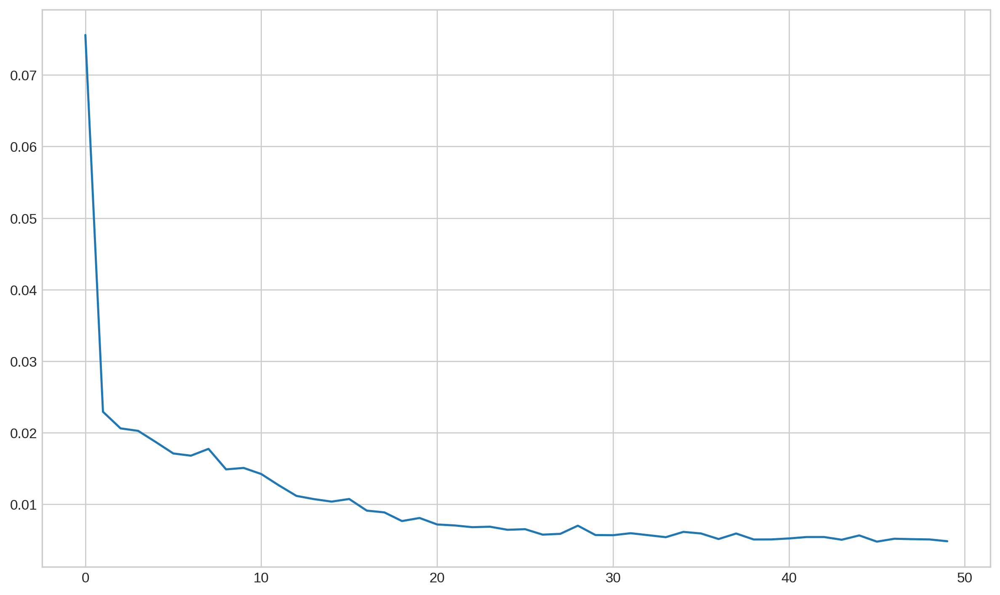

In [124]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [125]:
last_train_batch = Scaler_train[-12:]
last_train_batch = last_train_batch.reshape((1, n_input, n_features))
model.predict(last_train_batch)


1/1 [==============================] - 0s 134ms/step


array([[0.4877802]], dtype=float32)

In [126]:
Scaler_test[0]


array([0.5704917])

In [127]:
test_predictions = []

first_eval_batch = Scaler_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 [==============================] - 0s 16ms/step


In [128]:
test_predictions


[array([0.4877802], dtype=float32),
 array([0.5035473], dtype=float32),
 array([0.51986676], dtype=float32),
 array([0.5337903], dtype=float32),
 array([0.54528284], dtype=float32),
 array([0.553974], dtype=float32),
 array([0.56000614], dtype=float32),
 array([0.5647826], dtype=float32),
 array([0.5698768], dtype=float32),
 array([0.5749091], dtype=float32),
 array([0.5796989], dtype=float32),
 array([0.58418137], dtype=float32),
 array([0.58827704], dtype=float32),
 array([0.5919161], dtype=float32),
 array([0.595064], dtype=float32),
 array([0.5977439], dtype=float32),
 array([0.60001063], dtype=float32),
 array([0.60193557], dtype=float32),
 array([0.6035898], dtype=float32),
 array([0.60503095], dtype=float32),
 array([0.6063019], dtype=float32),
 array([0.6074303], dtype=float32),
 array([0.6084344], dtype=float32),
 array([0.609326], dtype=float32),
 array([0.6101142], dtype=float32),
 array([0.61080706], dtype=float32),
 array([0.61141306], dtype=float32),
 array([0.61194134], 

In [129]:
test.head()


Yr-mon
2018-01-01     90.615915
2018-02-01    402.686096
2018-03-01    374.638613
2018-04-01    130.741516
2018-05-01    -23.565139
Name: Stationary, dtype: float64

In [130]:
true_predictions = Scaler.inverse_transform(test_predictions)
test['Predictions'] = true_predictions

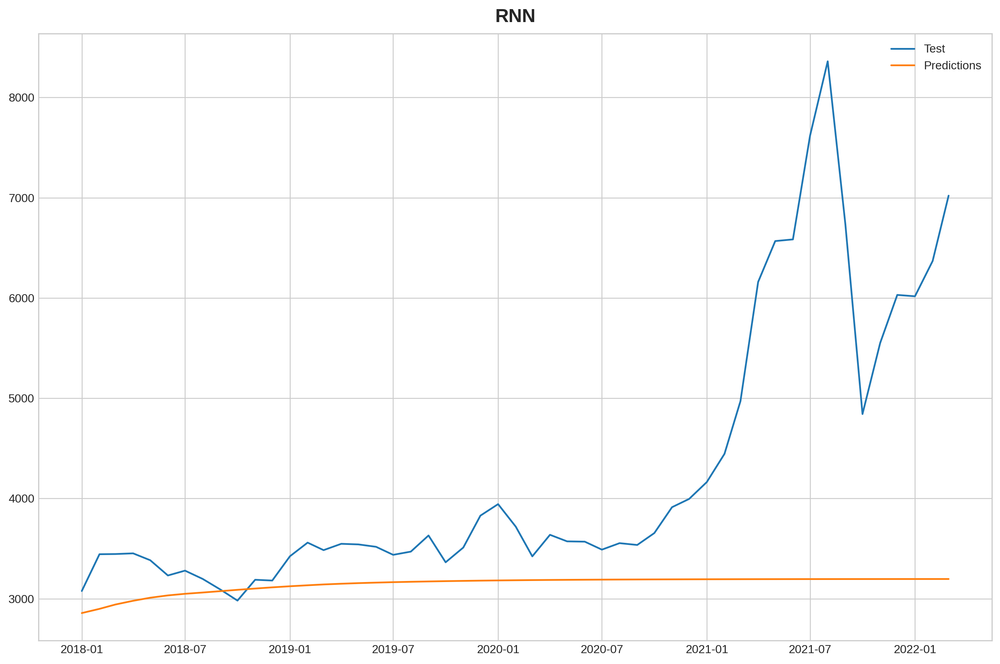

In [131]:
plt.figure(figsize=(12,8)) 
plt.plot(test_set.index,test_set['Modal Price (Rs./Quintal)'], label='Test') 
plt.plot(test_set.index,true_predictions, label='Predictions') 
plt.legend(loc='best') 
plt.title("RNN") 
plt.show()

In [132]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse=sqrt(mean_squared_error(test_set['Modal Price (Rs./Quintal)'],test['Predictions']))
print(rmse)

1720.6765919052025


## XGBoost


In [133]:
# Create features 
def create_features(df) :
    df['Month'] = df.index.month
    df['Year'] = df.index.year
    df['Day'] = df.index.dayofyear
    df['Quarter'] = df.index.quarter
    
    
    return df

In [134]:
dummy2 = pd.DataFrame()
dummy2 = create_features(pd.DataFrame(CropData_Summarized['Modal Price (Rs./Quintal)']))
dummy2

,Modal Price (Rs./Quintal),Month,Year,Day,Quarter
Yr-mon,,,,,
2008-04-01,2039.881656,4,2008,92,2
2008-05-01,2181.964961,5,2008,122,2
2008-06-01,2368.407317,6,2008,153,2
2008-07-01,2409.957051,7,2008,183,3
2008-08-01,2426.321804,8,2008,214,3
...,...,...,...,...,...
2021-11-01,5551.070236,11,2021,305,4
2021-12-01,6030.475412,12,2021,335,4
2022-01-01,6016.949594,1,2022,1,1


Text(0.5, 1.0, 'Year vs Price')

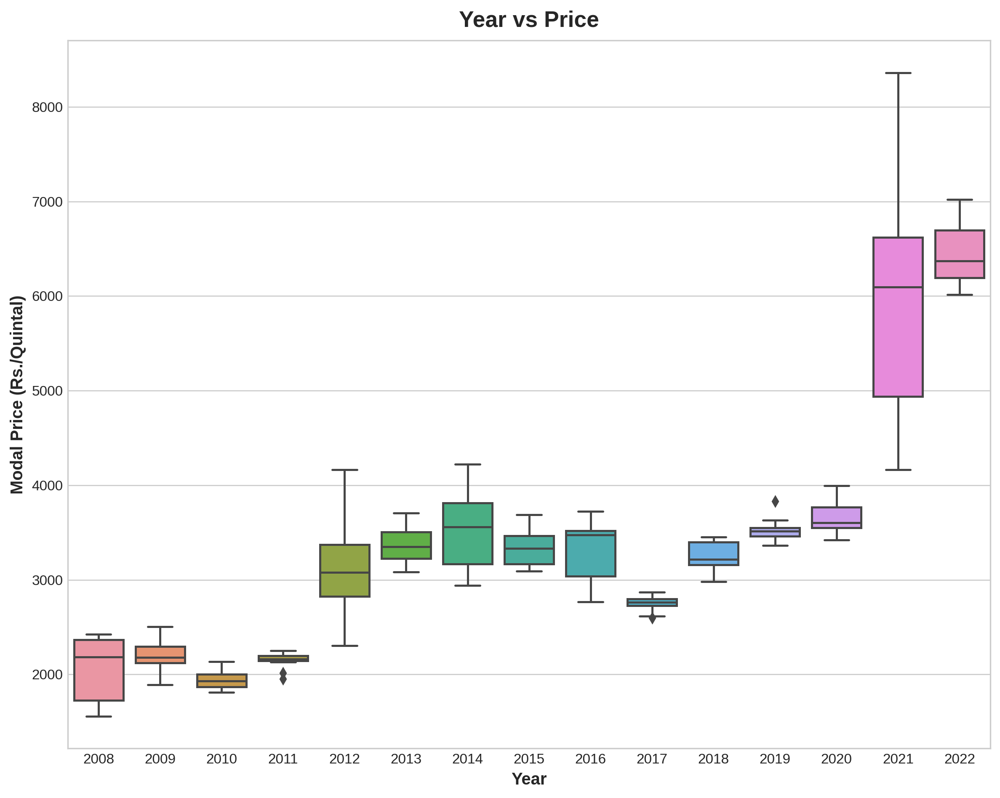

In [135]:
fig , ax = plt.subplots(figsize = (10,8))
sns.boxplot(data= dummy2 , x = 'Year' , y = 'Modal Price (Rs./Quintal)')
ax.set_title('Year vs Price')

Text(0.5, 1.0, 'Month vs Price')

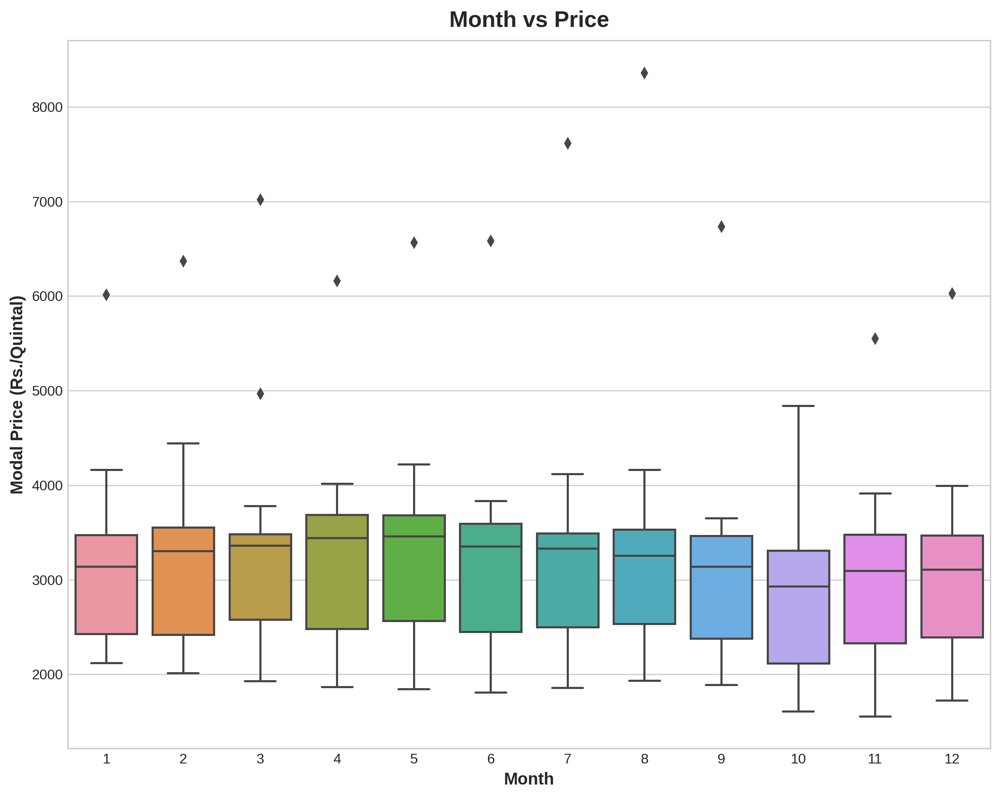

In [136]:
fig , ax = plt.subplots(figsize = (10,8))
sns.boxplot(data= dummy2 , x = 'Month' , y = 'Modal Price (Rs./Quintal)')
ax.set_title('Month vs Price')

In [137]:
train = create_features(train_set)
test = create_features(test_set)

FEATURES = ['Quarter', 'Month', 'Year']
TARGET = 'Modal Price (Rs./Quintal)'

X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

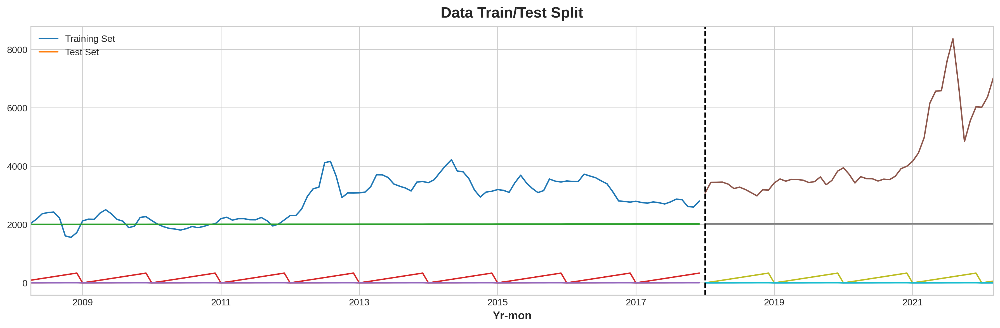

In [138]:
fig, ax = plt.subplots(figsize=(15, 5))
train.plot(ax=ax, label='Training Set', title='Data Train/Test Split')
test.plot(ax=ax, label='Test Set')
ax.axvline('01-01-2018', color='black', ls='--')
ax.legend(['Training Set', 'Test Set'])
plt.show()

In [139]:
reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',    
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[11:05:47] WARNING: ../src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:2848.92890	validation_1-rmse:4428.12353
[100]	validation_0-rmse:1104.16994	validation_1-rmse:2788.36847
[200]	validation_0-rmse:478.46559	validation_1-rmse:2270.48877
[300]	validation_0-rmse:267.33654	validation_1-rmse:2098.87957
[400]	validation_0-rmse:204.46021	validation_1-rmse:2034.70917
[500]	validation_0-rmse:179.87053	validation_1-rmse:2015.00713
[600]	validation_0-rmse:167.76374	validation_1-rmse:2007.70463
[678]	validation_0-rmse:162.26156	validation_1-rmse:2008.17403


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=50, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.01, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=1000,
             n_jobs=0, num_parallel_tree=1, objective='reg:linear',
             predictor='auto', random_state=0, reg_alpha=0, ...)

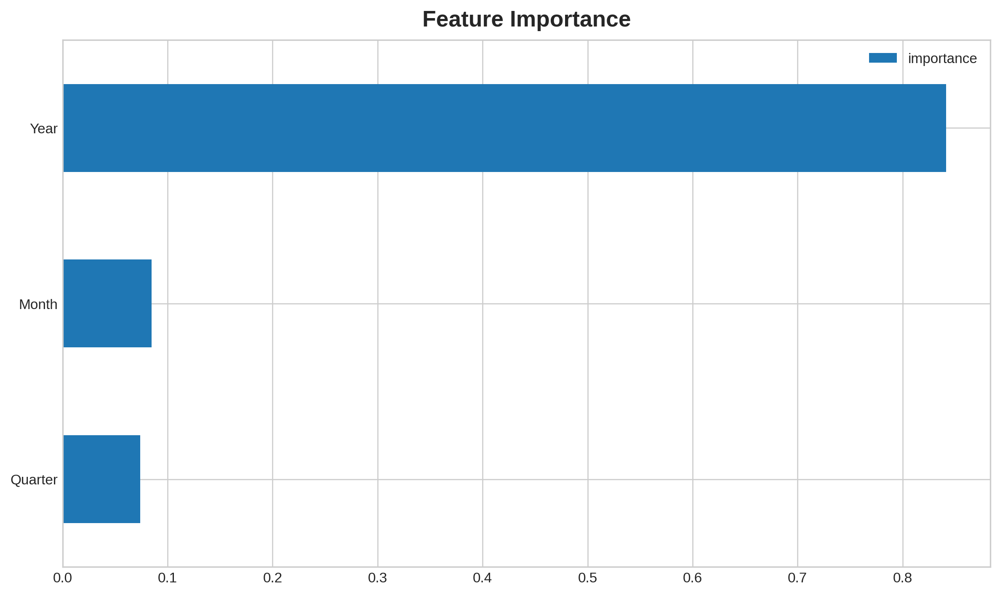

In [140]:
fi = pd.DataFrame(data=reg.feature_importances_,
             index=reg.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

In [141]:
dummy2

,Modal Price (Rs./Quintal),Month,Year,Day,Quarter
Yr-mon,,,,,
2008-04-01,2039.881656,4,2008,92,2
2008-05-01,2181.964961,5,2008,122,2
2008-06-01,2368.407317,6,2008,153,2
2008-07-01,2409.957051,7,2008,183,3
2008-08-01,2426.321804,8,2008,214,3
...,...,...,...,...,...
2021-11-01,5551.070236,11,2021,305,4
2021-12-01,6030.475412,12,2021,335,4
2022-01-01,6016.949594,1,2022,1,1


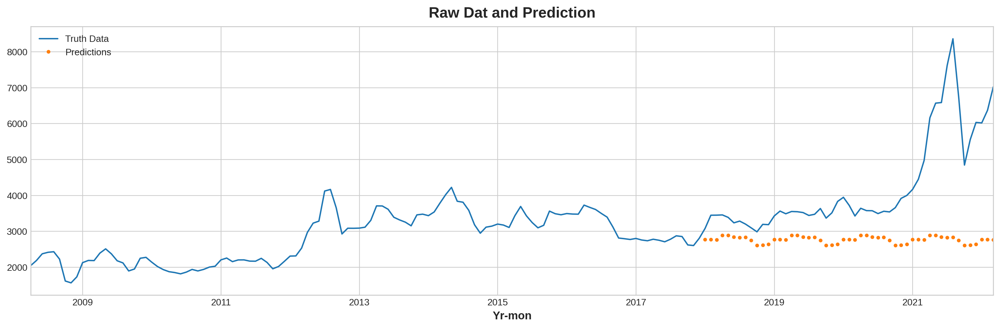

In [142]:
test['prediction'] = reg.predict(X_test)
train['prediction'] = reg.predict(X_train)
dummy2 = dummy2.merge(test[['prediction']], how='left', left_index=True, right_index=True)
ax = dummy2[['Modal Price (Rs./Quintal)']].plot(figsize=(15, 5))
dummy2['prediction'].plot(ax=ax, style='.')
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Raw Dat and Prediction')
plt.show()

In [143]:
score = np.sqrt(mean_squared_error(test['Modal Price (Rs./Quintal)'], test['prediction']))
print(f'RMSE Score on Test set: {score:0.2f}')

RMSE Score on Test set: 2007.23


In [144]:
test['error'] = np.abs(test[TARGET] - test['prediction'])
test['date'] = test.index.date
test.groupby(['date'])['error'].mean().sort_values(ascending=False).tail(10)

date
2018-11-01    579.776955
2018-04-01    567.276079
2018-12-01    547.801073
2018-05-01    498.687659
2018-07-01    454.947817
2018-06-01    398.495502
2018-10-01    379.135538
2018-08-01    370.823299
2018-09-01    344.863730
2018-01-01    313.220625
Name: error, dtype: float64